In [1]:
import os
import json
import pandas as pd
import numpy as np
import scipy.special as scs
from sklearn.preprocessing import normalize
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.linear_model import LinearRegression
from sklearn.svm import LinearSVC
from sklearn.cluster import KMeans, AgglomerativeClustering
import umap
import matplotlib.pyplot as plt
import seaborn as sns
from cartopy.io.shapereader import Reader

import sinetym.datasets
import sinetym.models
import sinetym.auxiliary
import sinetym.phonology
import sinetym.plot

np.random.seed(5981)

c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
config = json.load(open(r'C:\Users\lerna\git\sinetym\scripts\config.json'))
dialect_columns, input_columns, output_columns = [config['columns'][n] for n in ('dialect', 'input', 'output')]

emb_dir = r'C:\Users\lerna\git\sinetym\data\embeddings\linear_encoder_100_100_100_1_1'
for e in os.scandir(emb_dir):
    name, ext = os.path.splitext(e.name)
    if ext == '.csv':
        d = pd.read_csv(e.path, header=None, index_col=0, encoding='utf-8')
        d.set_index(d.index.fillna(''), inplace=True)
        globals()[name] = d

dialect_embs = [globals()[c] for c in dialect_columns]
input_embs = [globals()[c] for c in input_columns]
output_embs = [globals()[c] for c in output_columns]
try:
    output_biases = [globals()[c + '_bias'] for c in output_columns]
except KeyError:
    ...

initial_emb, final_emb, tone_emb = initial, final, tone

weight = np.reshape(
    np.loadtxt(os.path.join(emb_dir, 'weight.txt')),
    (dialect_embs[0].shape[-1], input_embs[0].shape[-1], -1)
)

In [3]:
dialect_infos = []
for d in config['datasets']:
    d = getattr(sinetym.datasets, d if isinstance(d, str) else d['name'])
    info = d.metadata['dialect_info'][[
        'group',
        'subgroup',
        'cluster',
        'subcluster',
        'spot',
        'latitude',
        'longitude'
    ]].copy()
    info.insert(0, 'dataset', d.name)
    info['did'] = info.index + 'mb01' if d is sinetym.datasets.zhongguoyuyan else info.index
    dialect_infos.append(info)

dialect = pd.concat(dialect_infos, axis=0)

dialect.loc[[
    'Z03E88',   # 北京
    'Z28E77',   # 咸阳
    'Z10G68',   # 南京
    'Z16300',   # 成都
    'Z10G69',   # 南通
    'Z12A91',   # 运城
    'Z12177',   # 太原
    'Z10G71',   # 苏州
    'Z08210',   # 温州
    'Z21J03',   # 黄山
    'Z26516',   # 长沙
    'Z26509',   # 双峰
    'Z18358',   # 南昌
    'Z02A14',   # 三明
    'Z15233',   # 梅州
    'Z15229',   # 惠州
    'Z15231',   # 广州
    'Z15235',   # 江门
    'Z01G23',   # 南宁
    'Z01G29',   # 桂林
    'Z02A05',   # 福州
    'Z02G49',   # 厦门
    'Z23C55',   # 海口
    'Z02193',   # 建瓯
    'Z35H08',   # 韶关
    'Z26D48',   # 永州
    'Z26J61',   # 怀化
], 'representative'] = True
dialect['representative'].fillna(False, inplace=True)

In [4]:
char = sinetym.datasets.zhongguoyuyan.metadata['char_info'].copy()
char['cid'] = char.index

char[['initial_voicing', 'tone']] = sinetym.datasets.zhongguoyuyan.filter(id='08210mb01') \
    .groupby('cid').agg({
        'initial': lambda x: x.map(sinetym.phonology.get_voicing).fillna('').mode().iloc[0],
        'tone': lambda x: x.mode().iloc[0]
    })
char[['initial_manner', 'coda_type']] = sinetym.datasets.zhongguoyuyan.filter(id='15233mb01') \
    .groupby('cid').agg({
        'initial': lambda x: x.map(sinetym.phonology.get_manner).fillna('').mode().iloc[0],
        'final': lambda x: x.map(sinetym.phonology.get_coda_type).fillna('').mode().iloc[0]
    })

In [5]:
shp_prefix = r'C:\Users\lerna\git\ChinaAdminDivisonSHP'
china = tuple(Reader(os.path.join(shp_prefix, '1. Country', 'country.shp')).geometries())
province = tuple(Reader(os.path.join(shp_prefix, '2. Province', 'province.shp')).geometries())

In [6]:
def get_emb(embs, inputs):
    emb = np.empty((len(embs), inputs.shape[0], embs[0].shape[1]), dtype=np.float32)
    for i in range(emb.shape[0]):
        emb[i] = embs[i].reindex(inputs.iloc[:, i])
        emb[i, np.any(np.isnan(emb[i]), axis=1)] = embs[i].loc['']

    return np.mean(emb, axis=0)

def get_output(output_embs, emb, biases=None):
    output = np.empty((emb.shape[0], len(output_embs)), dtype=str)

    for i, e in enumerate(output_embs):
        logits = emb @ e.values.T
        if biases is not None:
            logits += biases[i].values.T

        output[:, i] = e.index[np.argmax(logits[:, :-1], axis=1)]

    return output

def transform(dialect_emb, input_emb, weight, residual=False):
    output_emb = np.reshape(input_emb[:, None, :] @ np.tensordot(dialect_emb, weight, (-1, 0)), (input_emb.shape[0], -1))
    return input_emb + output_emb if residual else output_emb

def get_transform(dialect_emb, weight, residual=False):
    trans = np.tensordot(dialect_emb, weight, [-1, 0])
    return trans + np.eye(trans.shape[-1]) if residual else trans

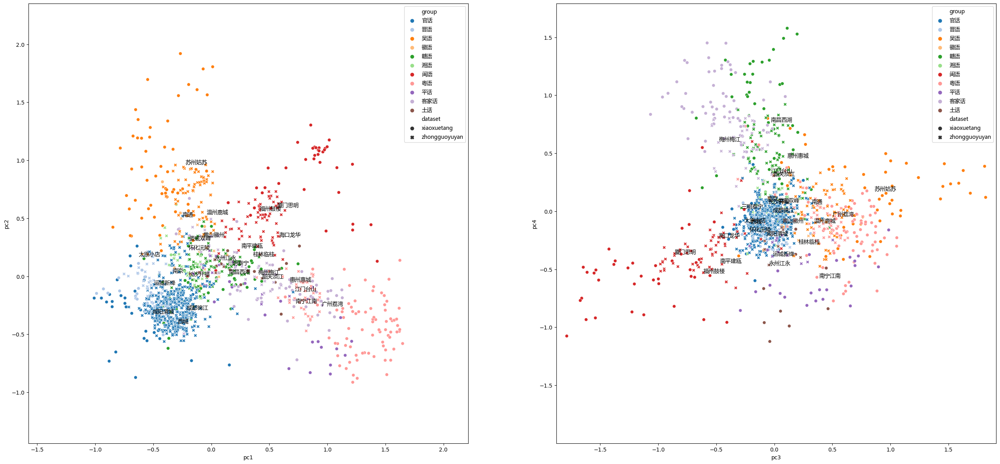

In [7]:
dialect_emb = get_emb(dialect_embs, dialect[dialect_columns])
dialect_pca = PCA(4)
columns = [f'pc{i + 1}' for i in range(dialect_pca.n_components)]
dialect[columns] = dialect_pca.fit_transform(dialect_emb)

scale = (dialect[columns].max() - dialect[columns].min()).max() * 1.05

fig = plt.figure(figsize=(32, 18))

for i in range(2):
    c1 = f'pc{i * 2 + 1}'
    c2 = f'pc{i * 2 + 2}'

    ax = fig.add_subplot(1, 2, i + 1, aspect='equal')
    sns.scatterplot(dialect[dialect['group'] != ''], x=c1, y=c2, hue='group', style='dataset', palette='tab20', ax=ax)
    for _, r in dialect[dialect['representative']].iterrows():
        ax.annotate(r['spot'], xy=r[[c1, c2]], family='Microsoft Yahei')
    ax.set_xlim((dialect[c1].min() + dialect[c1].max() + np.asarray([-1, 1]) * scale) / 2)
    ax.set_ylim((dialect[c1].min() + dialect[c2].max() + np.asarray([-1, 1]) * scale) / 2)
    ax.legend(prop={'family': 'Microsoft Yahei'})

plt.show()
plt.close()

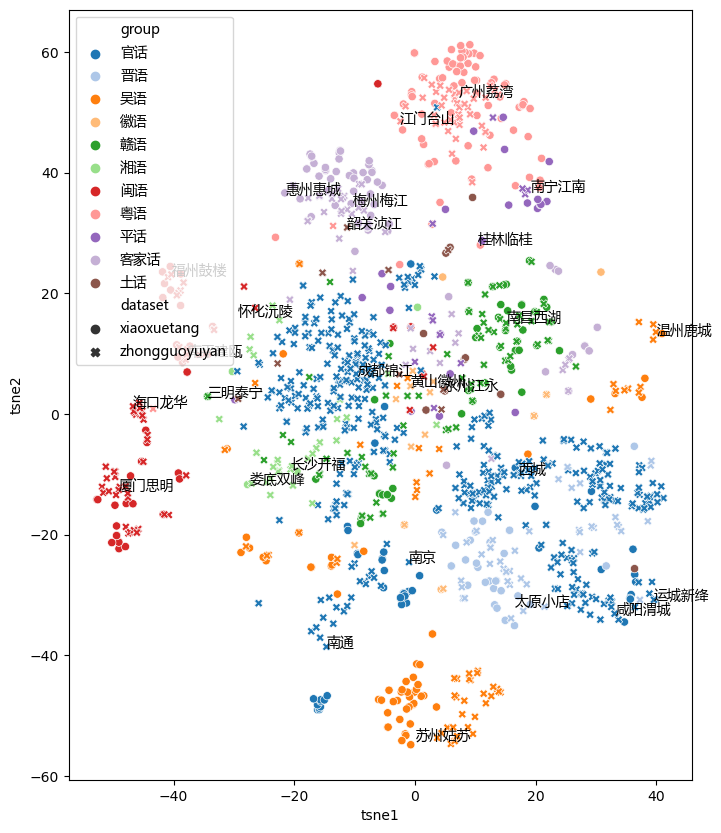

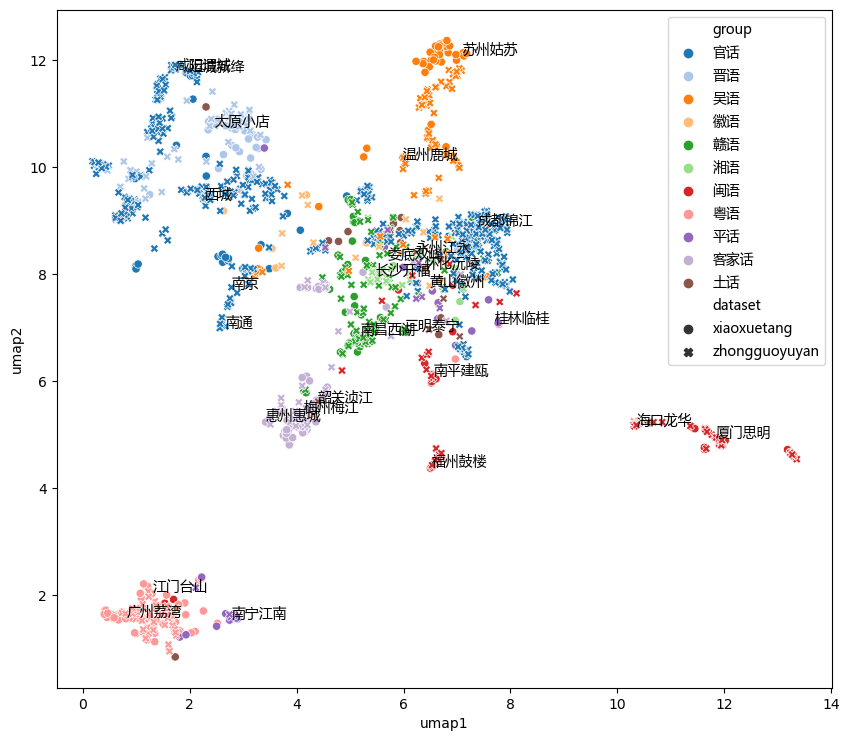

In [8]:
for prefix, transformer in (('tsne', TSNE(2)), ('umap', umap.UMAP(n_components=2))):
    dialect[[f'{prefix}1', f'{prefix}2']] = transformer.fit_transform(dialect_emb)

    plt.figure(figsize=(10, 10))
    ax = plt.axes(aspect='equal')

    sns.scatterplot(data=dialect[dialect['group'] != ''], x=f'{prefix}1', y=f'{prefix}2', hue='group', style='dataset', palette='tab20', ax=ax)
    for _, r in dialect[dialect['representative']].iterrows():
        ax.annotate(r['spot'], xy=r[[f'{prefix}1', f'{prefix}2']], family='Microsoft Yahei')
    ax.legend(prop={'family': 'Microsoft Yahei'})

    plt.show()
    plt.close()

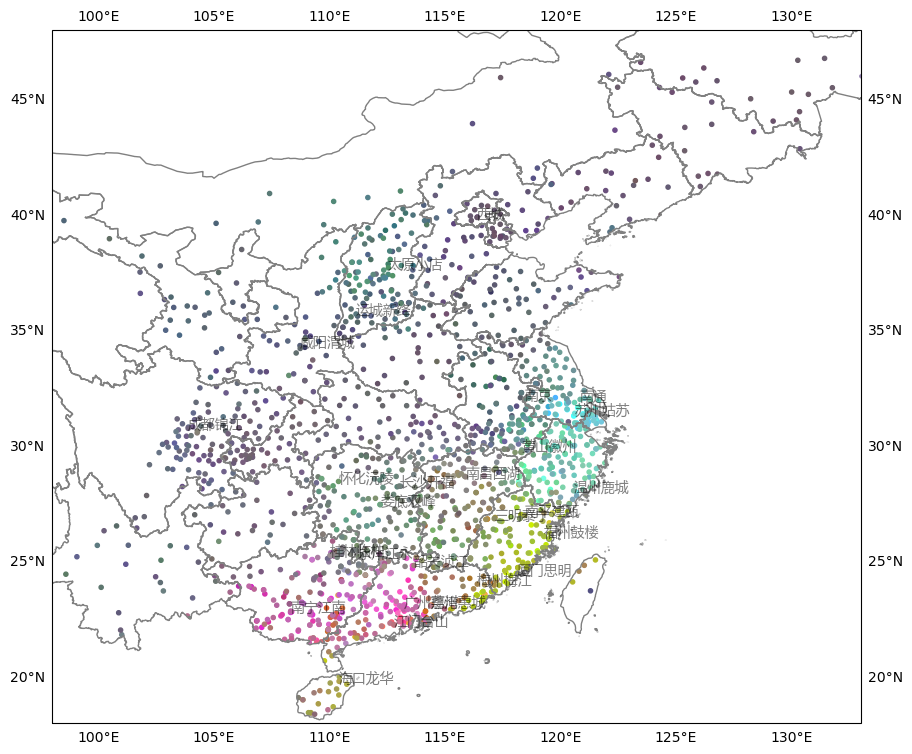

In [9]:
plt.figure(figsize=(16, 9))
ax, _, _ = sinetym.plot.geography.scatter(
    dialect['latitude'],
    dialect['longitude'],
    sinetym.auxiliary.pc2color(dialect[['pc1', 'pc2', 'pc3']].values),
    extent=[98, 133, 18, 48],
    scale=3,
    clip=china,
    marker='.'
)
ax.add_geometries(province, ax.projection, edgecolor='gray', facecolor='none')

for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['longitude', 'latitude']], alpha=0.5, family='Microsoft Yahei')

gl = ax.gridlines(draw_labels=True)
gl.xlines = False
gl.ylines = False
plt.show()
plt.close()

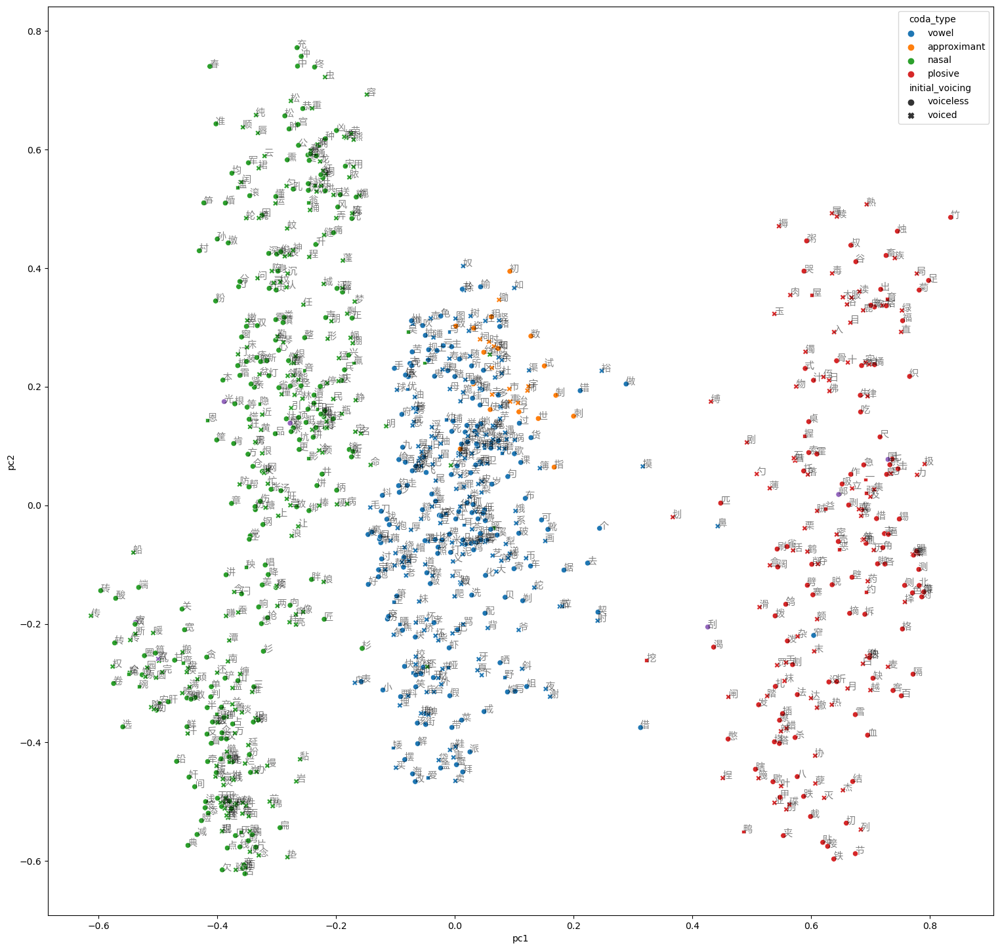

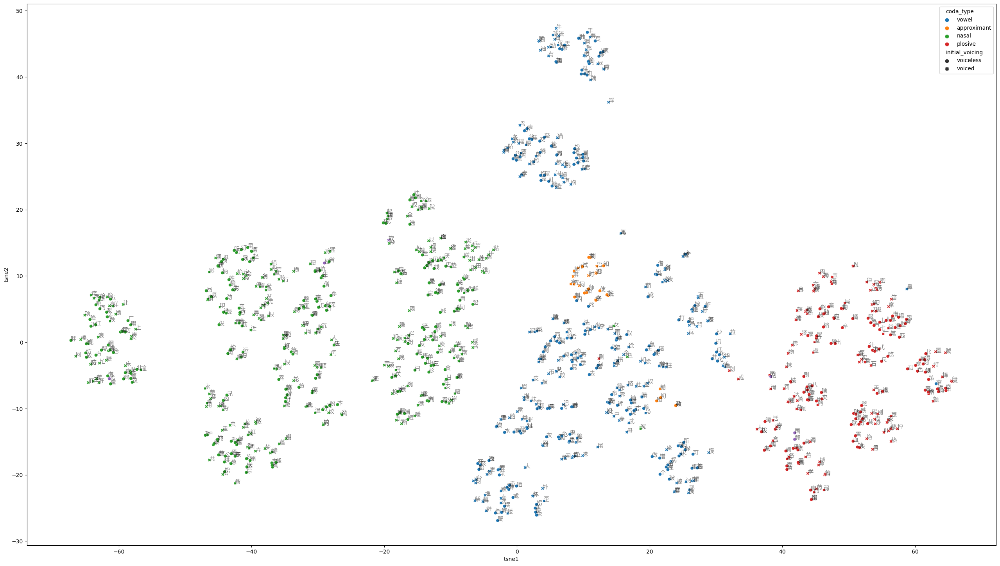

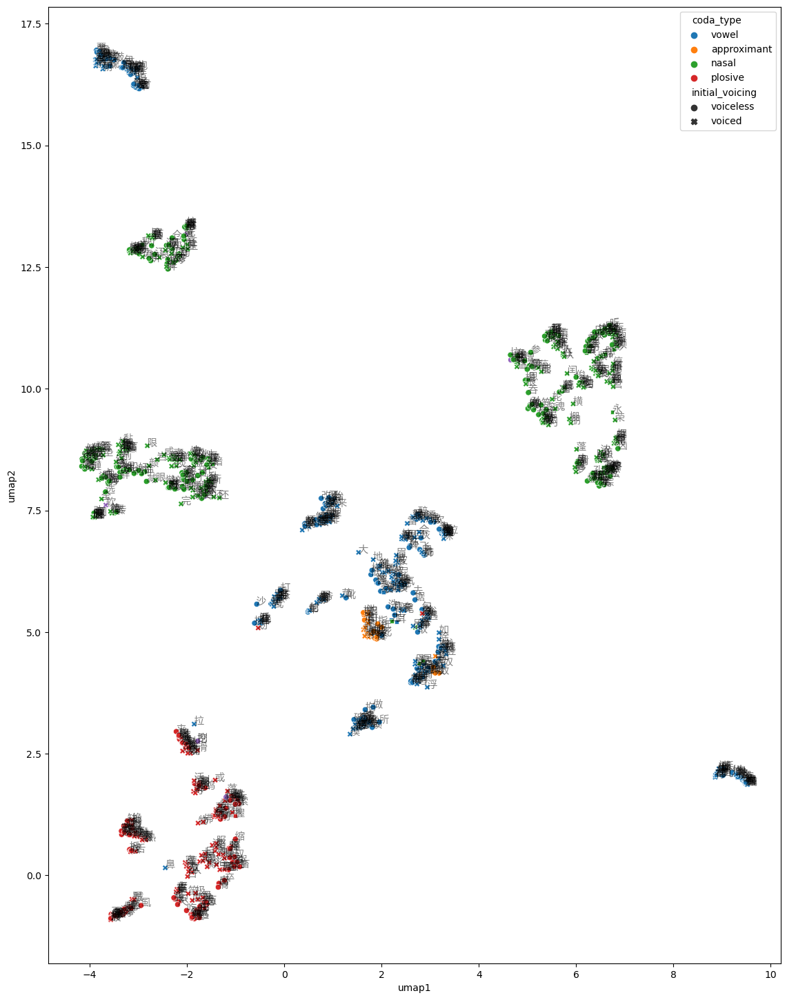

In [10]:
char_emb = get_emb(input_embs, char[input_columns])
char_pca = PCA(4)

for prefix, transformer in (('pc', char_pca), ('tsne', TSNE(2)), ('umap', umap.UMAP(n_components=2))):
    char[[f'{prefix}{i + 1}' for i in range(transformer.n_components)]] = transformer.fit_transform(char_emb)

    plt.figure(figsize=(32, 18))
    ax = plt.axes(aspect='equal')

    sns.scatterplot(char, x=f'{prefix}1', y=f'{prefix}2', hue='coda_type', style='initial_voicing', palette='tab10', ax=ax)
    for _, r in char[char['character'].notna()].iterrows():
        ax.annotate(r['character'], xy=r[[f'{prefix}1', f'{prefix}2']], alpha=0.5, family='Microsoft Yahei')

    plt.show()
    plt.close()

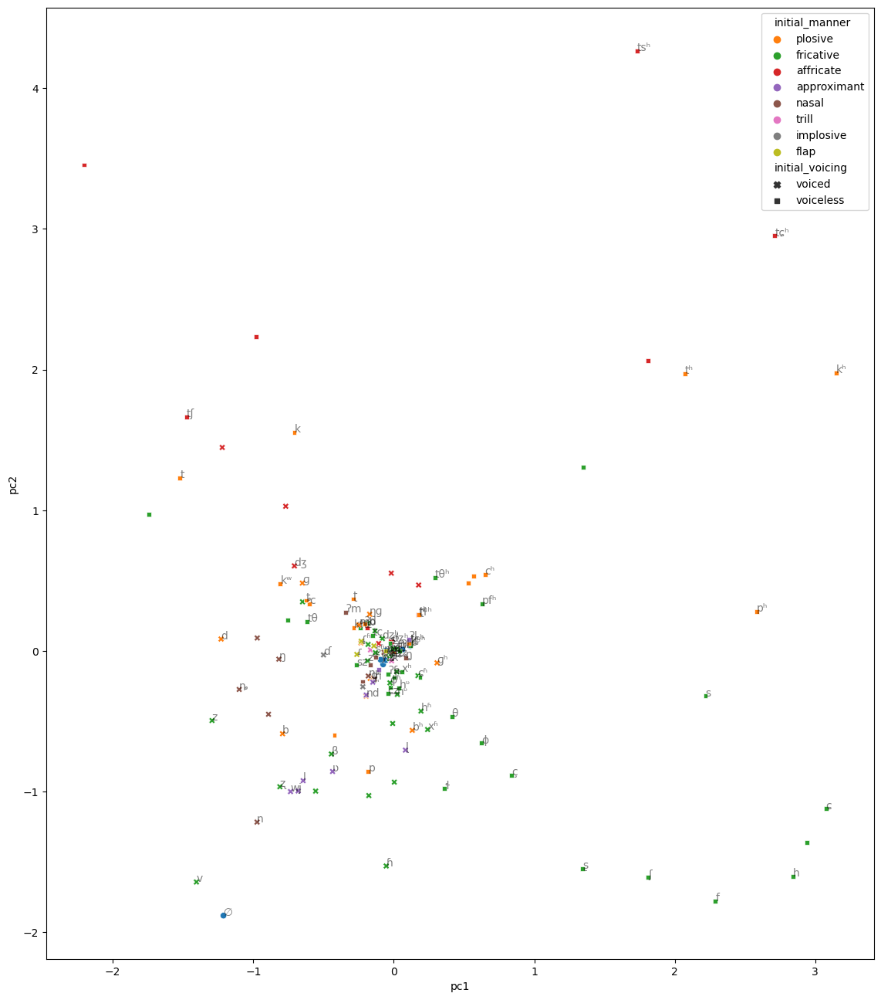

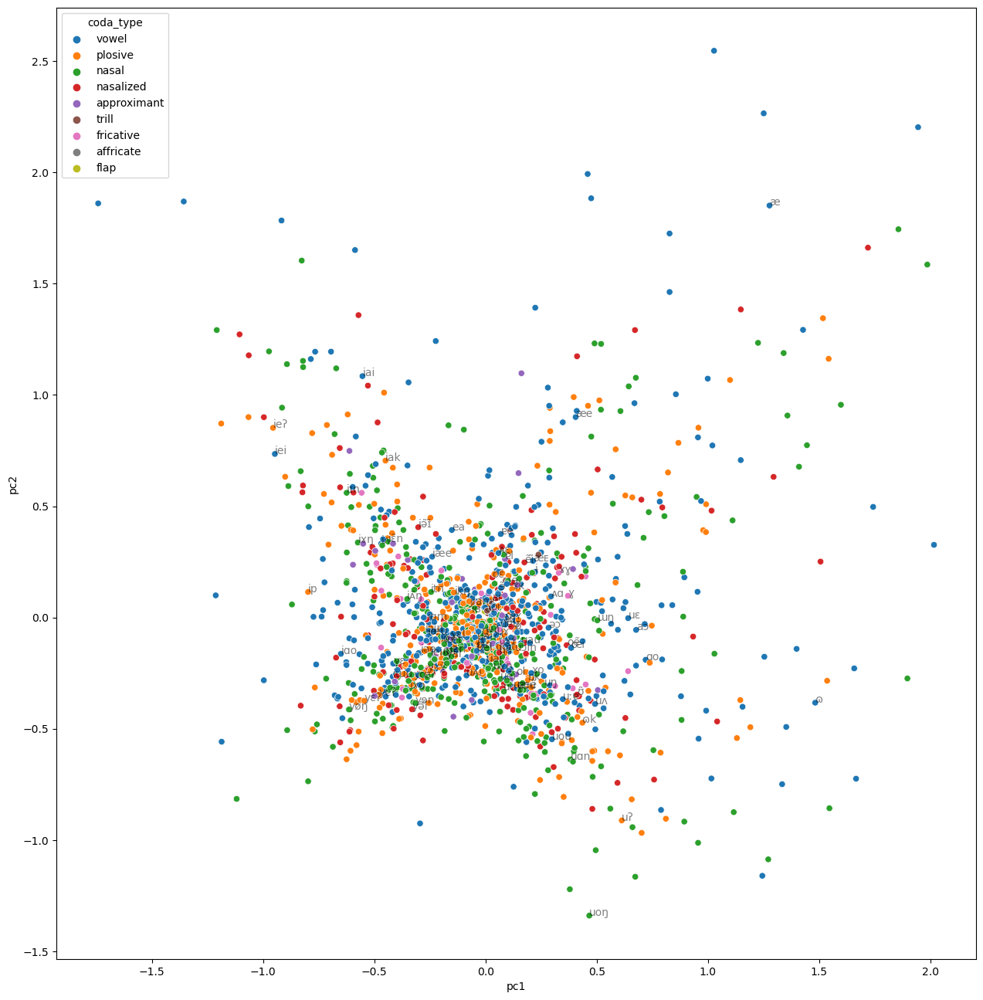

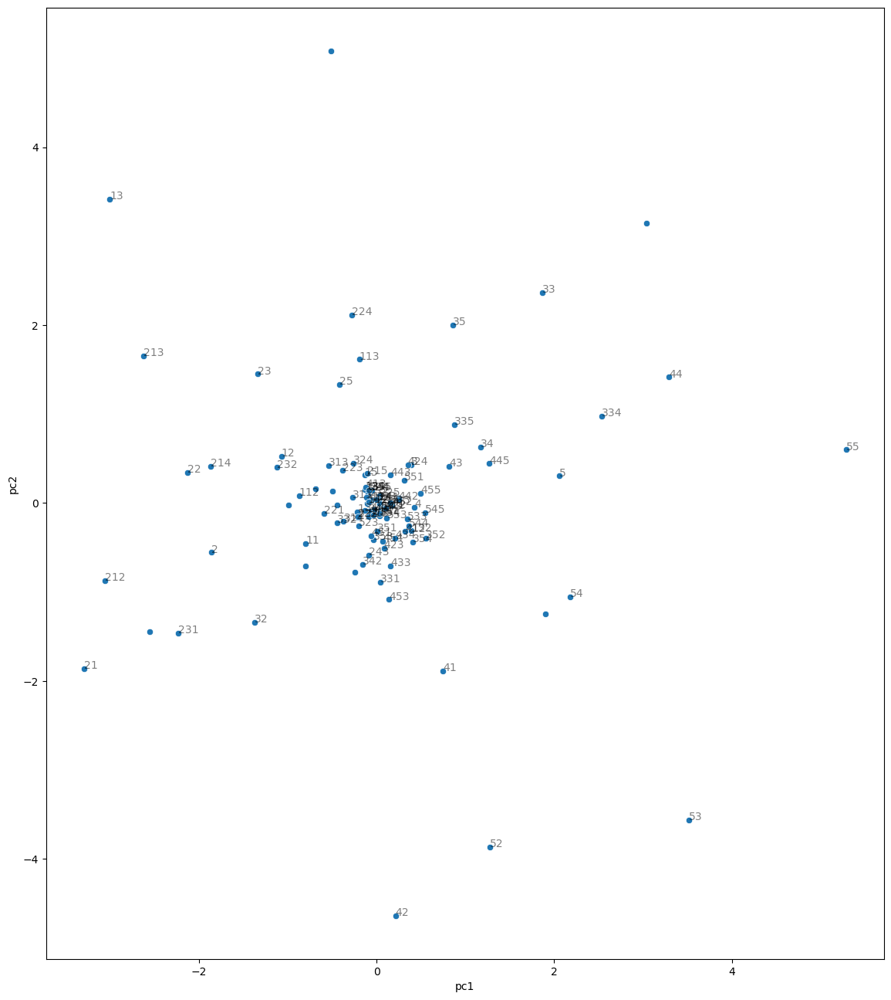

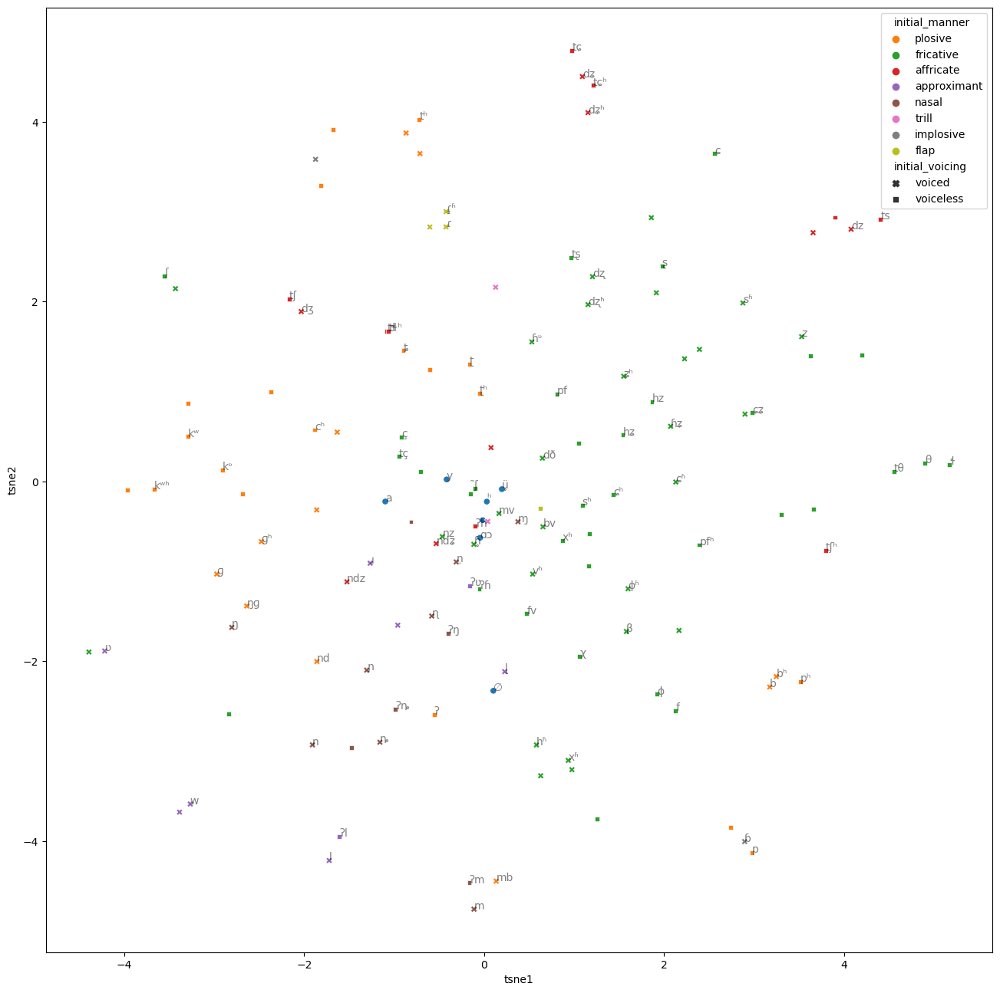

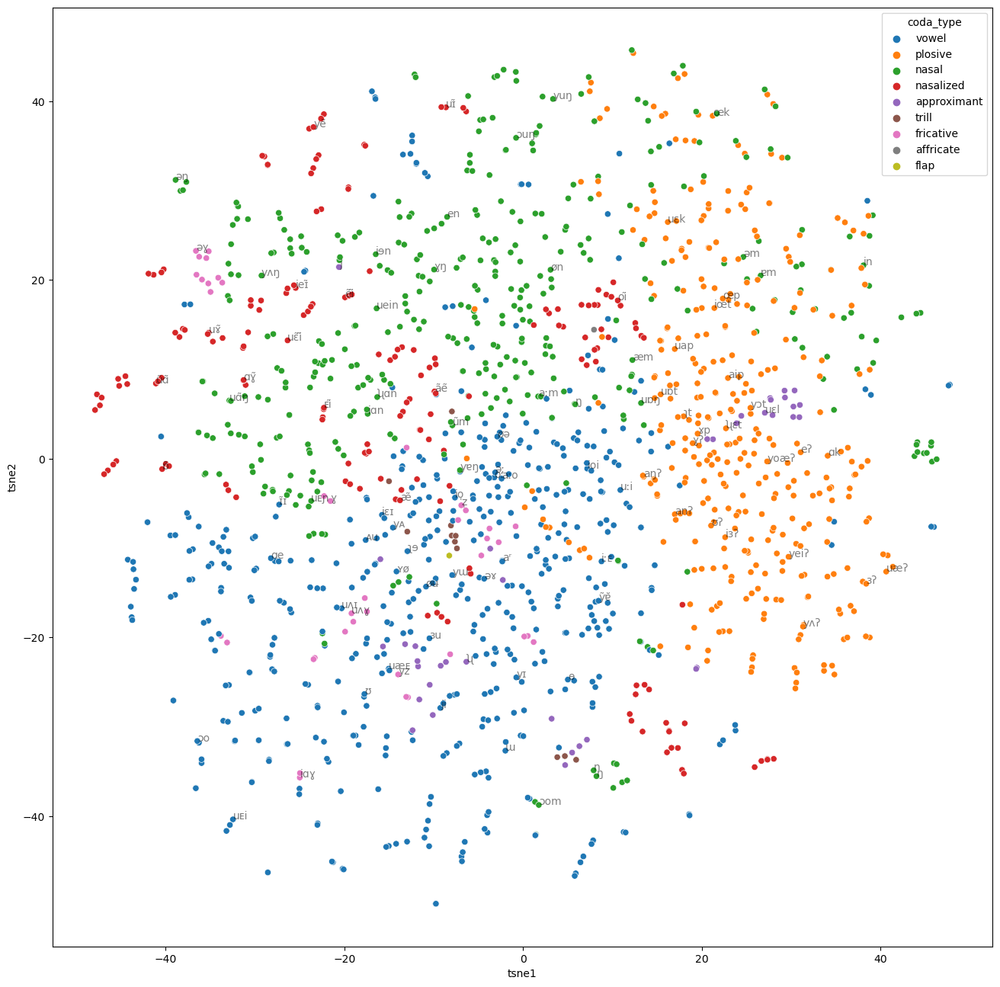

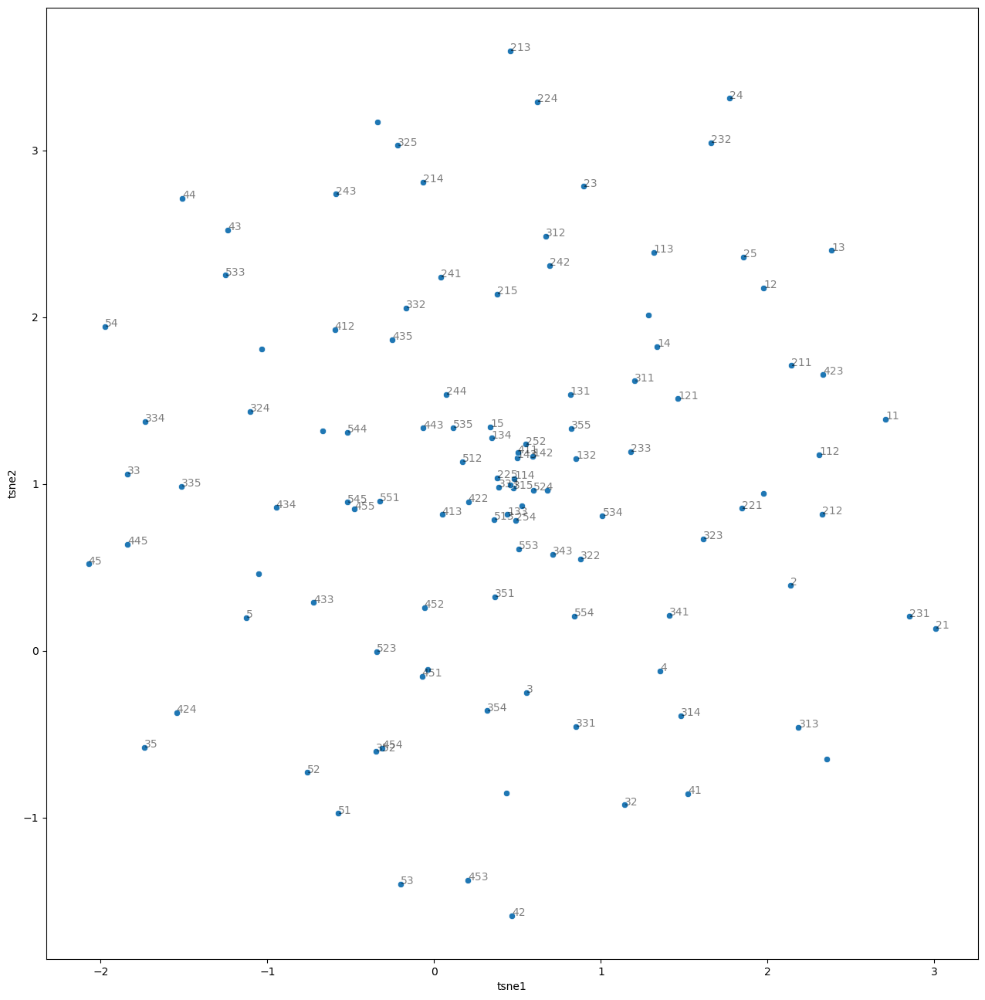

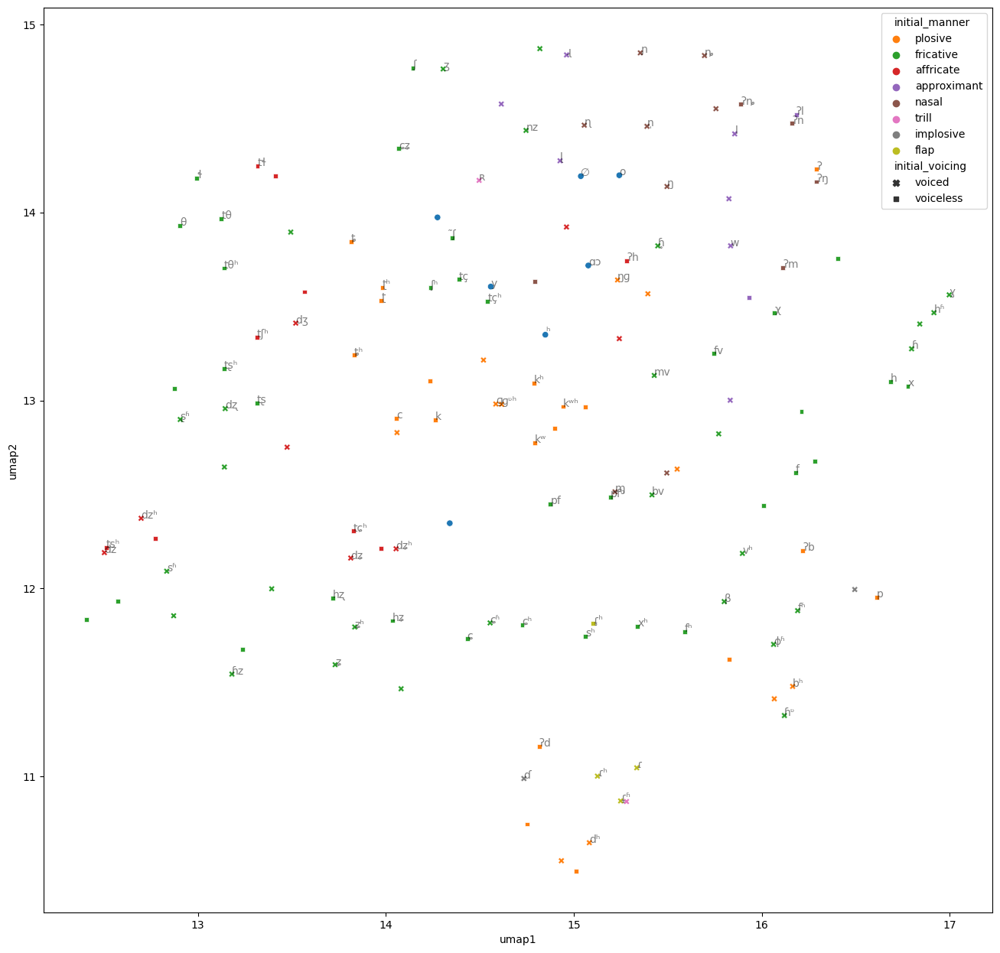

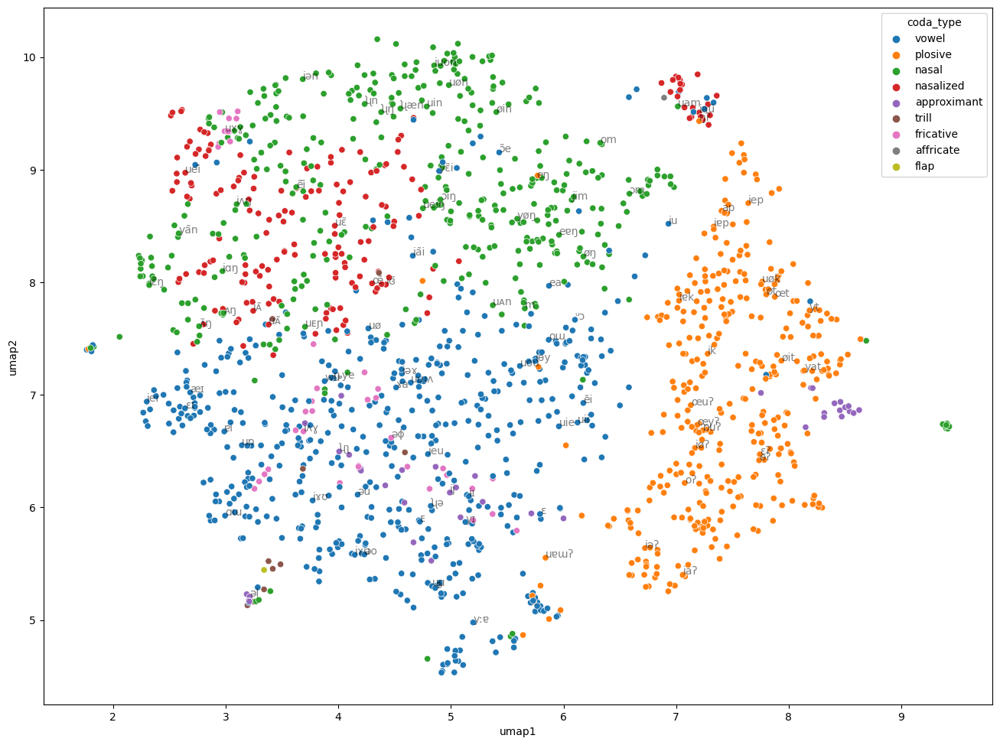

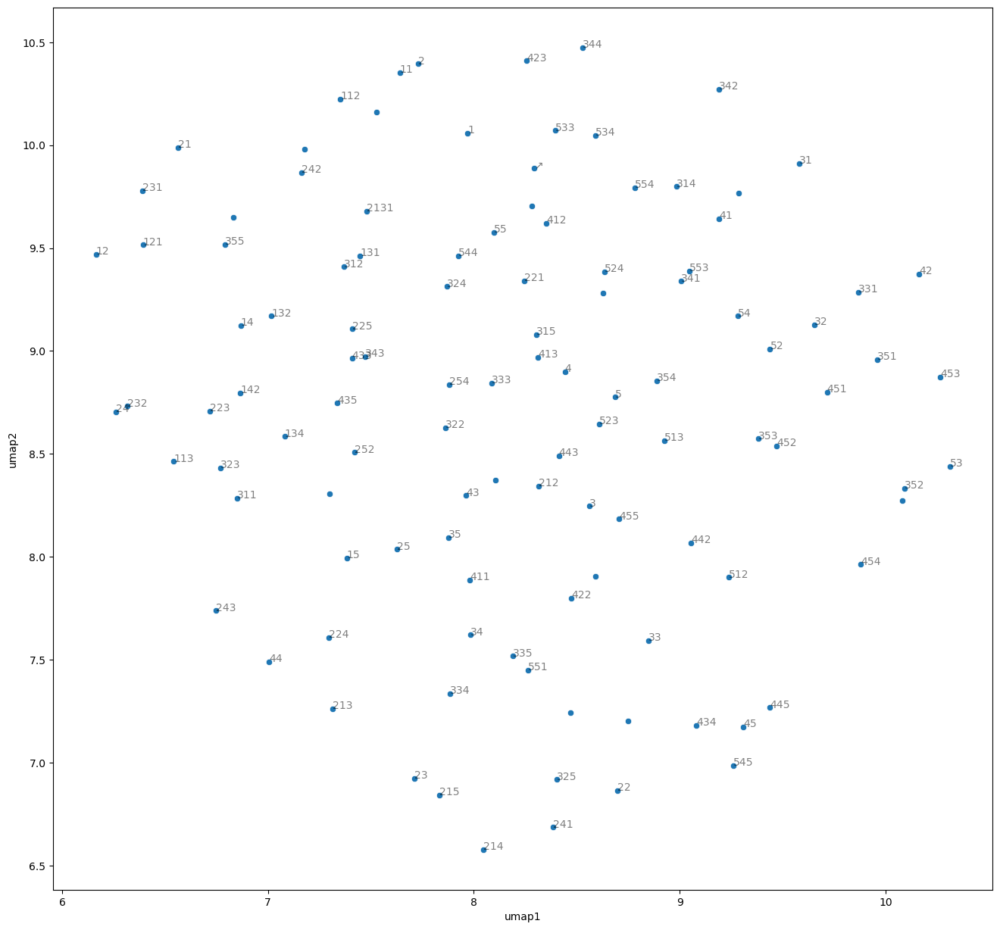

In [11]:
initial = pd.DataFrame({
    'initial_voicing': initial_emb.index[:-1].map(sinetym.phonology.get_voicing).fillna(''),
    'initial_manner': initial_emb.index[:-1].map(sinetym.phonology.get_manner).fillna('')
}, index=initial_emb.index[:-1])
final = pd.DataFrame({'coda_type': final_emb.index[:-1].map(sinetym.phonology.get_coda_type).fillna('')}, index=final_emb.index[:-1])
tone = pd.DataFrame(index=tone_emb.index[:-1])

for i, t in enumerate(('initial', 'final', 'tone')):
    target = globals()[t]
    emb = globals()[f'{t}_emb']
    pca = PCA(2)
    globals()[f'{t}_pca'] = pca

    for prefix, transformer in (('pc', pca), ('tsne', TSNE(2)), ('umap', umap.UMAP(n_components=2))):
        target[[f'{prefix}1', f'{prefix}2']] = transformer.fit_transform(emb.values[:-1])

for prefix in ('pc', 'tsne', 'umap'):
    plt.figure(figsize=(16, 16))
    ax = plt.axes(aspect='equal')
    sns.scatterplot(initial, x=f'{prefix}1', y=f'{prefix}2', hue='initial_manner', style='initial_voicing', palette='tab10', ax=ax)
    for i, r in initial.sample(100).iterrows():
        ax.annotate(i, xy=r[[f'{prefix}1', f'{prefix}2']], alpha=0.5)
    plt.show()
    plt.close()

    plt.figure(figsize=(16, 16))
    ax = plt.axes(aspect='equal')
    sns.scatterplot(final, x=f'{prefix}1', y=f'{prefix}2', hue='coda_type', palette='tab10', ax=ax)
    for i, r in final.sample(100).iterrows():
        ax.annotate(i, xy=r[[f'{prefix}1', f'{prefix}2']], alpha=0.5)
    plt.show()
    plt.close()

    plt.figure(figsize=(16, 16))
    ax = plt.axes(aspect='equal')
    sns.scatterplot(tone, x=f'{prefix}1', y=f'{prefix}2', ax=ax)
    for i, r in tone.sample(100).iterrows():
        ax.annotate(i, xy=r[[f'{prefix}1', f'{prefix}2']], alpha=0.5)
    plt.show()
    plt.close()

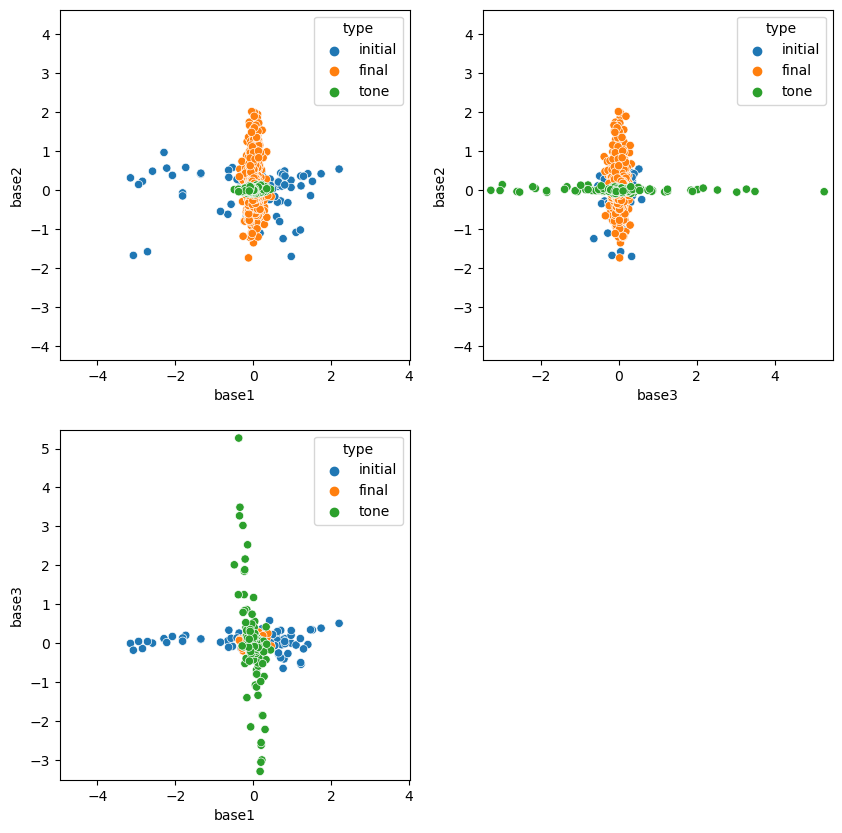

In [12]:
q, _ = np.linalg.qr(np.stack([initial_pca.components_[0], final_pca.components_[0], tone_pca.components_[0]], axis=1))
output = pd.concat([initial.assign(type='initial'), final.assign(type='final'), tone.assign(type='tone')], axis=0, ignore_index=True)
output[['base1', 'base2', 'base3']] = pd.concat(output_embs, axis=0, ignore_index=True) @ q

scale = (output[['base1', 'base2', 'base3']].max() - output[['base1', 'base2', 'base3']].min()).max() * 1.05
lim1, lim2, lim3 = (np.min(output[['base1', 'base2', 'base3']].values, axis=0, keepdims=True).T \
    + np.max(output[['base1', 'base2', 'base3']].values, axis=0, keepdims=True).T \
    + np.asarray([[-1, 1]]) * scale) / 2

fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1, aspect='equal')
sns.scatterplot(output, x='base1', y='base2', hue='type', palette='tab10', ax=ax)
ax.set_xlim(lim1)
ax.set_ylim(lim2)

ax = fig.add_subplot(2, 2, 2, aspect='equal')
sns.scatterplot(output, x='base3', y='base2', hue='type', palette='tab10', ax=ax)
ax.set_xlim(lim3)
ax.set_ylim(lim2)

ax = fig.add_subplot(2, 2, 3, aspect='equal')
sns.scatterplot(output, x='base1', y='base3', hue='type', palette='tab10', ax=ax)
ax.set_xlim(lim1)
ax.set_ylim(lim3)

plt.show()
plt.close()

In [13]:
dialect = dialect[dialect['dataset'] == 'zhongguoyuyan']
dialect_emb = get_emb(dialect_embs, dialect[dialect_columns])

dialect_sample = dialect.sample(100)
data = sinetym.datasets.zhongguoyuyan.filter(id=dialect_sample['did'].str[1:]).copy()
data['did'] = data['did'] + data['variant']
data['initial_voicing'] = data['initial'].map(sinetym.phonology.get_voicing).fillna('')
data['initial_manner'] = data['initial'].map(sinetym.phonology.get_manner).fillna('')
data['coda_type'] = data['final'].map(sinetym.phonology.get_coda_type).fillna('')

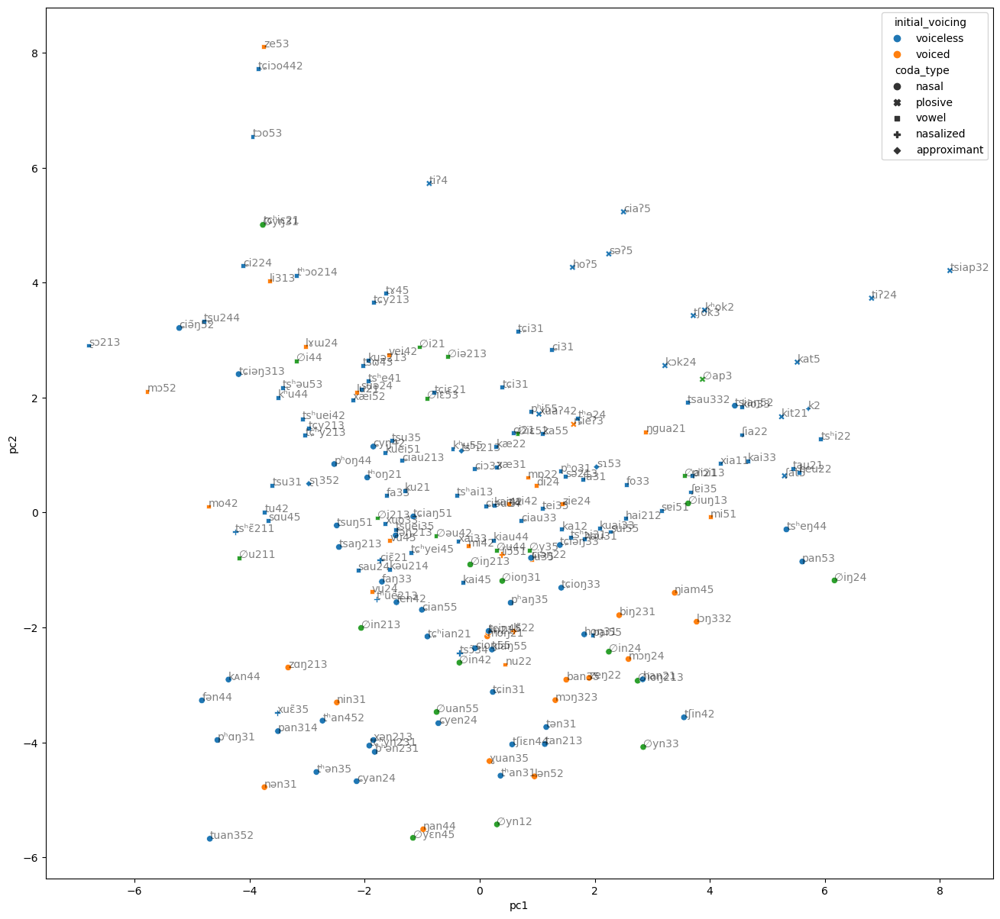

In [14]:
sample = data.sample(200)
output_emb = transform(
    get_emb(dialect_embs, sample[dialect_columns]),
    get_emb(input_embs, sample[input_columns]),
    weight,
    residual=True
)
outputs = get_output(output_embs, output_emb, output_biases)
output_emb2 = get_emb(output_embs, sample[output_columns])

output_pca = PCA(2)
sample[['pc1', 'pc2']] = output_pca.fit_transform(output_emb)
output_pc2 = output_pca.transform(output_emb2)

plt.figure(figsize=(16, 16))
ax = plt.axes(aspect='equal')

sns.scatterplot(data=sample, x='pc1', y='pc2', hue='initial_voicing', style='coda_type', palette='tab10', ax=ax)
for i, r in sample.iterrows():
    ax.annotate(f'{"".join(r[["initial", "final", "tone"]])}', xy=r[['pc1', 'pc2']], alpha=0.5,)

plt.show()
plt.close()

c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


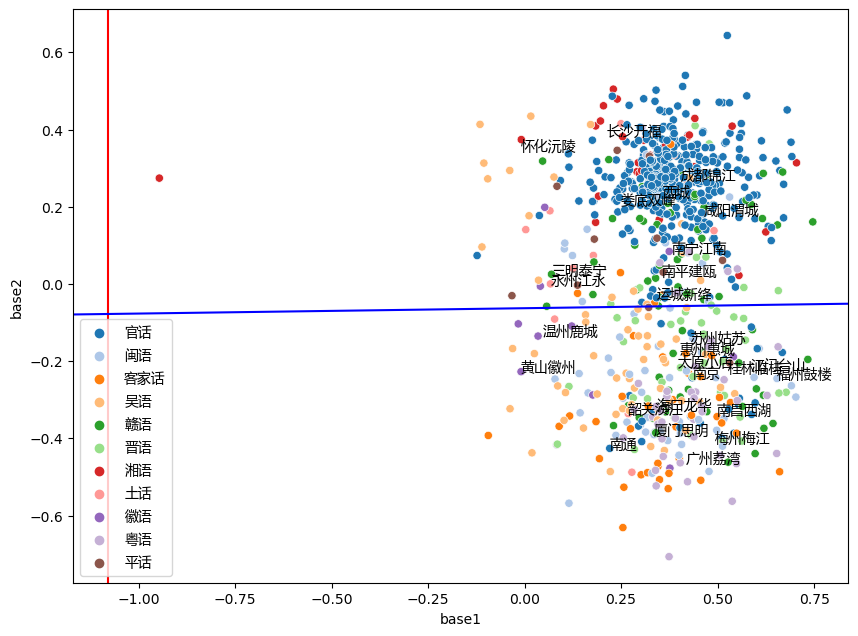

In [15]:
train_data = data[(data['cid'] == 'Z0014') & data['initial_voicing'].notna()]
voiced_svc = LinearSVC().fit(get_emb(dialect_embs, train_data[dialect_columns]), train_data['initial_voicing'])
train_data = data[(data['cid'] == 'Z0656') & data['coda_type'].notna()]
plosive_svc = LinearSVC().fit(get_emb(dialect_embs, train_data[dialect_columns]), np.where(train_data['coda_type'] == 'plosive', 1, 0))

w1 = voiced_svc.coef_[0] / np.linalg.norm(voiced_svc.coef_[0])
b1 = voiced_svc.intercept_[0] / np.linalg.norm(voiced_svc.coef_[0])
w2 = plosive_svc.coef_[0] / np.linalg.norm(plosive_svc.coef_[0])
b2 = plosive_svc.intercept_[0] / np.linalg.norm(plosive_svc.coef_[0])
q, _ = np.linalg.qr(np.stack([w1, w2], axis=1))

dialect[['base1', 'base2']] = dialect_emb @ q

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')

sns.scatterplot(dialect[dialect['group'] != ''], x='base1', y='base2', hue='group', palette='tab20', ax=ax)

for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['base1', 'base2']], family='Microsoft Yahei')

ax.axvline((-b1 * w1) @ q[:, 0], color='red')
ax.axline((-b2 * w2) @ q, slope=(-w2 @ q[:, 0]) / (w2 @ q[:, 1]), color='blue')

ax.legend(prop={'family': 'Microsoft Yahei'})
plt.show()
plt.close()

c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\lerna\AppData\Local\miniconda3\lib\site-packages\sklearn\svm\_classes.py:32: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(


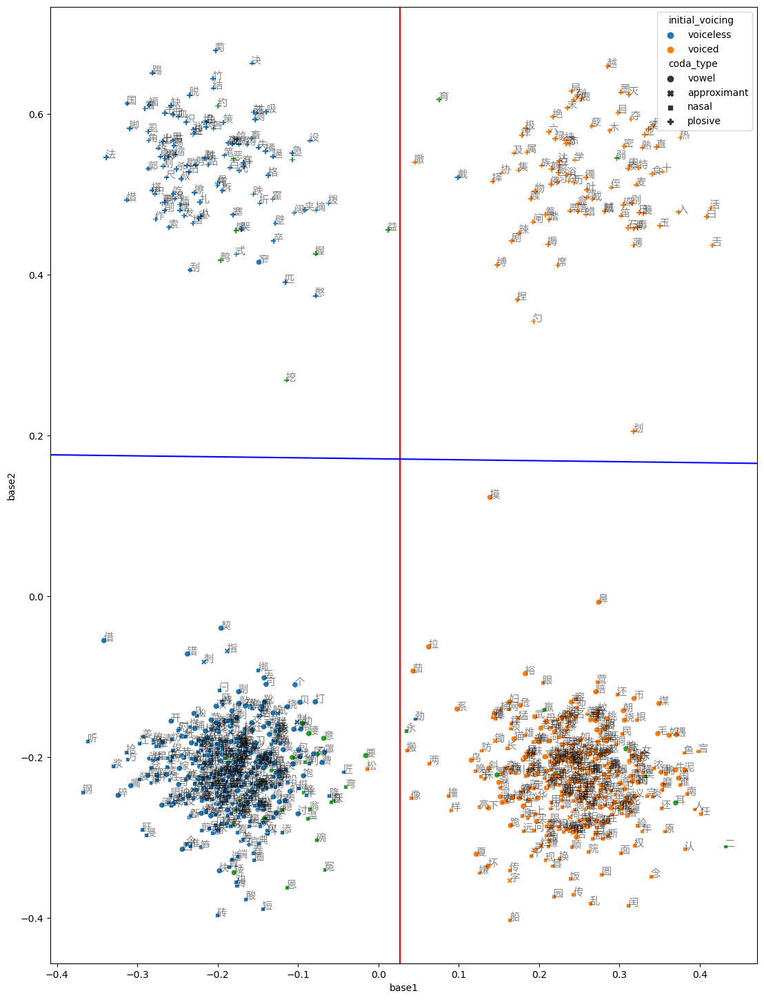

In [16]:
train_data = char.reset_index(drop=True)[(char['initial_voicing'] != '').values].sample(frac=0.5)
voiced_svc = LinearSVC().fit(char_emb[train_data.index], train_data['initial_voicing'])
train_data = char.reset_index(drop=True)[(char['coda_type'] != '').values].sample(frac=0.5)
plosive_svc = LinearSVC().fit(char_emb[train_data.index], train_data['coda_type'] == 'plosive')

w1 = voiced_svc.coef_[0] / np.linalg.norm(voiced_svc.coef_[0])
b1 = voiced_svc.intercept_[0] / np.linalg.norm(voiced_svc.coef_[0])
w2 = plosive_svc.coef_[0] / np.linalg.norm(plosive_svc.coef_[0])
b2 = plosive_svc.intercept_[0] / np.linalg.norm(plosive_svc.coef_[0])
q, _ = np.linalg.qr(np.stack([w1, w2], axis=1))
voiced_char_dir = w1
plosive_char_dir = w2

char[['base1', 'base2']] = char_emb @ q

plt.figure(figsize=(32, 18))
ax = plt.axes(aspect='equal')

sns.scatterplot(char, x='base1', y='base2', hue='initial_voicing', style='coda_type', palette='tab10', ax=ax)
for _, r in char[char['character'].notna()].iterrows():
    ax.annotate(r['character'], xy=r[['base1', 'base2']], alpha=0.5, family='Microsoft Yahei')

ax.axvline(np.dot(-b1 * w1, q[:, 0]), color='red')
ax.axline(np.dot(-b2 * w2, q), slope=-np.dot(w2, q[:, 0]) / np.dot(w2, q[:, 1]), color='blue')

plt.show()
plt.close()

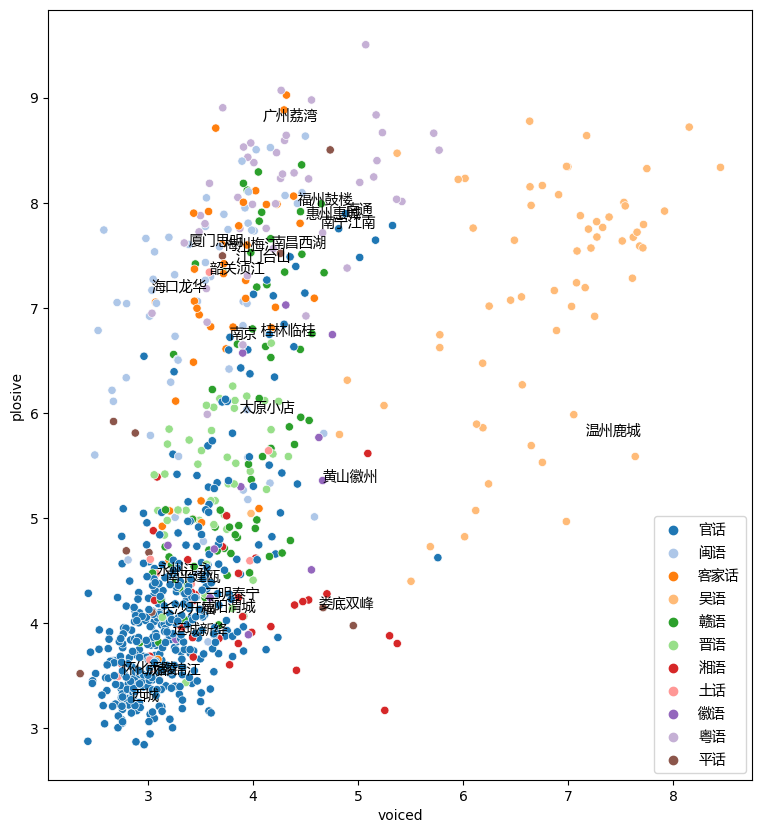

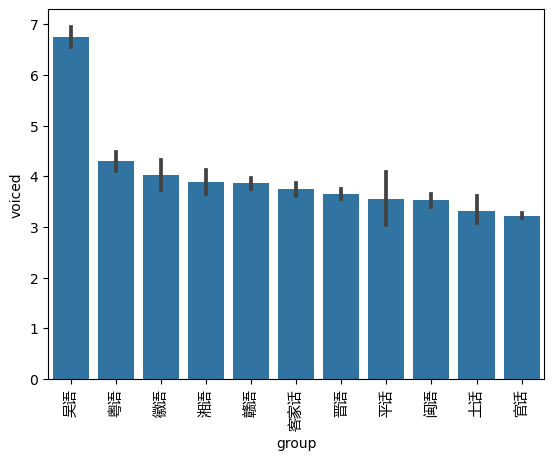

In [17]:
trans = get_transform(dialect_emb, weight, residual=True)
w = np.stack([voiced_svc.coef_[0], plosive_svc.coef_[0]])
w = w / np.linalg.norm(w, axis=1, keepdims=True)
dialect[['voiced', 'plosive']] = np.linalg.norm(np.tensordot(trans, w, [1, 1]), axis=1)

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')
sns.scatterplot(dialect[dialect['group'] != ''], x='voiced', y='plosive', hue='group', palette='tab20', ax=ax)
for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['voiced', 'plosive']], family='Microsoft Yahei')
ax.legend(prop={'family': 'Microsoft Yahei'})
plt.show()
plt.close()

sns.barplot(
    data=dialect[dialect['group'] != ''],
    x='group',
    y='voiced',
    order=dialect[dialect['group'] != ''].groupby('group')['voiced'].mean().sort_values(ascending=False).index,
    color='tab:blue'
)
plt.xticks(family='Microsoft Yahei', rotation='vertical')
plt.show()
plt.close()

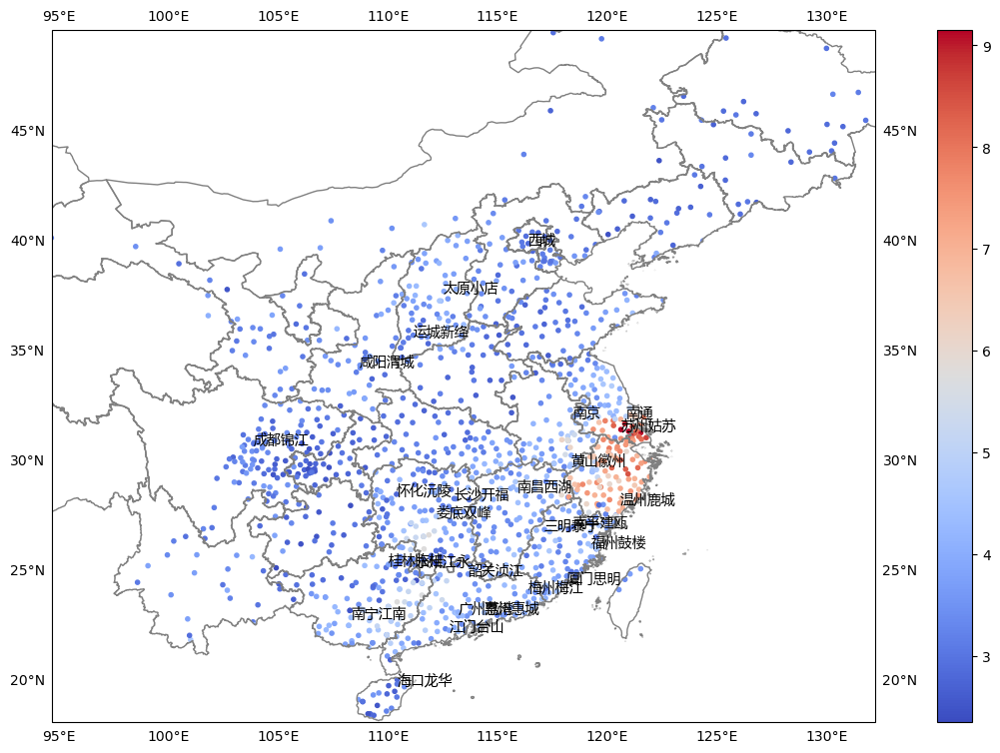

In [18]:
plt.figure(figsize=(16, 9))
ax, _, cs = sinetym.plot.geography.scatter(
    dialect['latitude'],
    dialect['longitude'],
    dialect['voiced'],
    scale=3,
    clip=china,
    marker='.',
    cmap='coolwarm'
)
ax.add_geometries(province, ax.projection, edgecolor='gray', facecolor='none')

for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['longitude', 'latitude']], family='Microsoft Yahei')

gl = ax.gridlines(draw_labels=True)
gl.xlines = False
gl.ylines = False
plt.colorbar(cs)
plt.show()
plt.close()

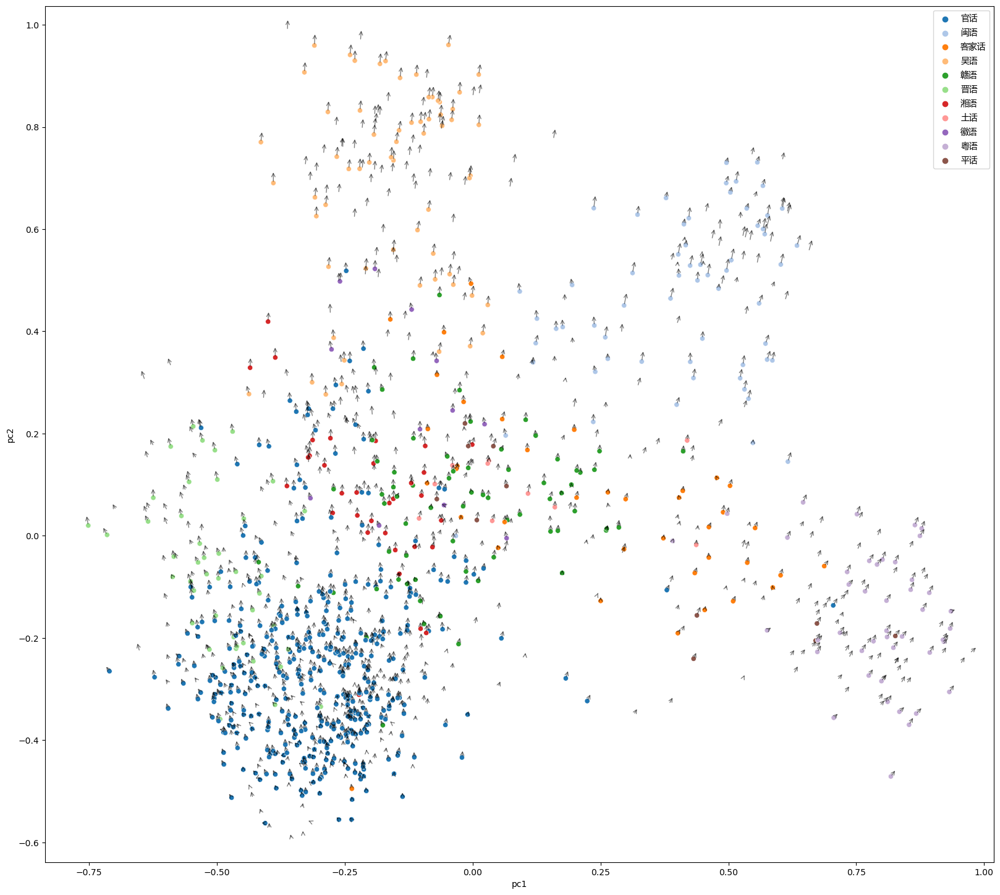

In [19]:
w = np.tensordot(weight, voiced_char_dir, [1, 0])
voiced_dialect_dir = (dialect_emb @ w + voiced_char_dir) @ w.T
voiced_dialect_dir /= np.linalg.norm(voiced_dialect_dir, axis=1, keepdims=True)

pc = dialect_pca.transform(dialect_emb + 0.05 * voiced_dialect_dir)

plt.figure(figsize=(32, 18))
ax = plt.axes(aspect='equal')
sns.scatterplot(dialect[dialect['group'] != ''], x='pc1', y='pc2', hue='group', palette='tab20', ax=ax)
for i, (_, r) in enumerate(dialect.iterrows()):
    ax.annotate('', xy=pc[i, :2], xytext=r[['pc1', 'pc2']], arrowprops={'arrowstyle': '->', 'alpha': 0.5})
ax.legend(prop={'family': 'Microsoft Yahei'})
plt.show()
plt.close()

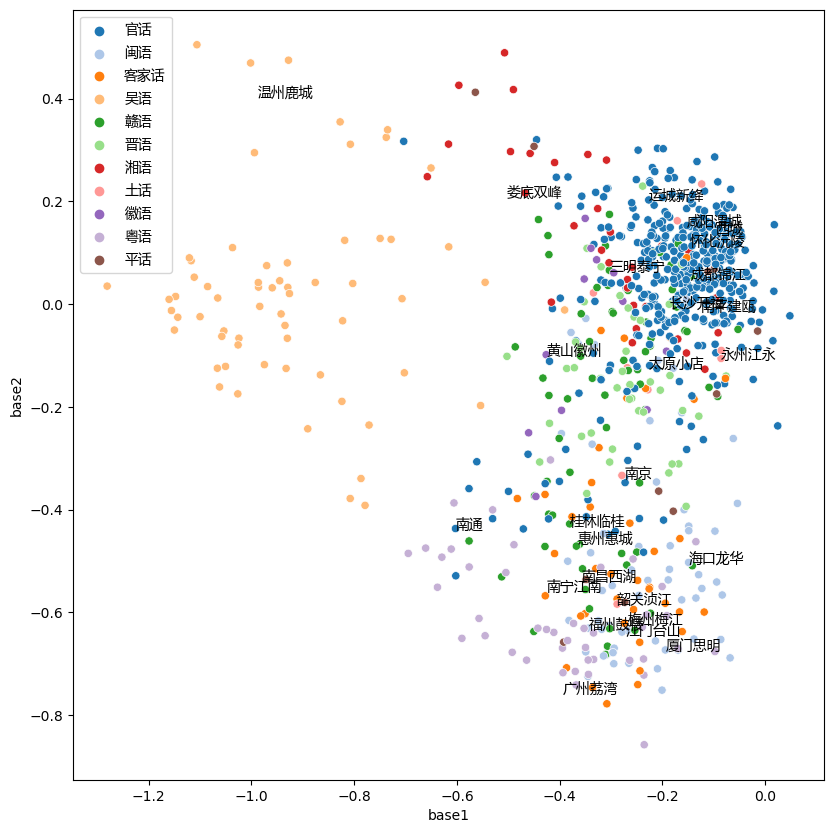

In [20]:
lr = LinearRegression().fit(dialect_emb, dialect[['voiced', 'plosive']])
q, _ = np.linalg.qr(np.stack(lr.coef_, axis=1))

dialect[['base1', 'base2']] = dialect_emb @ q

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')

sns.scatterplot(dialect[dialect['group'] != ''], x='base1', y='base2', hue='group', palette='tab20', ax=ax)
for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['base1', 'base2']], family='Microsoft Yahei')

ax.legend(prop={'family': 'Microsoft Yahei'})

plt.show()
plt.close()

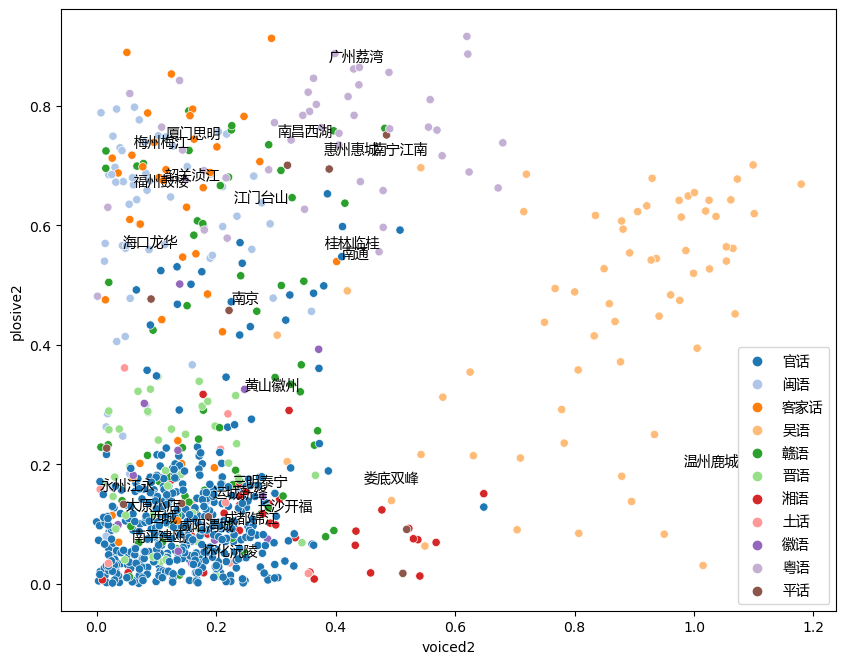

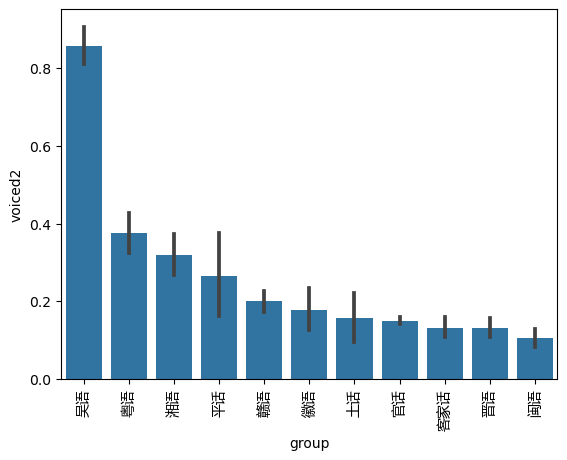

In [21]:
y = np.tensordot(weight, voiced_char_dir, [1, 0])
a = y @ y.T
s, q = np.linalg.eig(a)
voiced_dialect_dir = q[:, np.argmax(s)]
voiced_dialect_dir /= np.linalg.norm(voiced_dialect_dir)
dialect['voiced2'] = np.abs(np.tensordot(dialect_emb, voiced_dialect_dir, [-1, 0]))

y = np.tensordot(weight, plosive_char_dir, [1, 0])
a = y @ y.T
s, q = np.linalg.eig(a)
plosive_dialect_dir = q[:, np.argmax(s)]
plosive_dialect_dir /= np.linalg.norm(plosive_dialect_dir)
dialect['plosive2'] = np.abs(np.tensordot(dialect_emb, plosive_dialect_dir, [-1, 0]))

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')
sns.scatterplot(dialect[dialect['group'] != ''], x='voiced2', y='plosive2', hue='group', palette='tab20', ax=ax)
for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['voiced2', 'plosive2']], family='Microsoft Yahei')
ax.legend(prop={'family': 'Microsoft Yahei'})
plt.show()
plt.close()

sns.barplot(
    data=dialect[dialect['group'] != ''],
    x='group',
    y='voiced2',
    order=dialect[dialect['group'] != ''].groupby('group')['voiced2'].mean().sort_values(ascending=False).index,
    color='tab:blue'
)
plt.xticks(rotation='vertical', family='Microsoft Yahei')
plt.show()
plt.close()

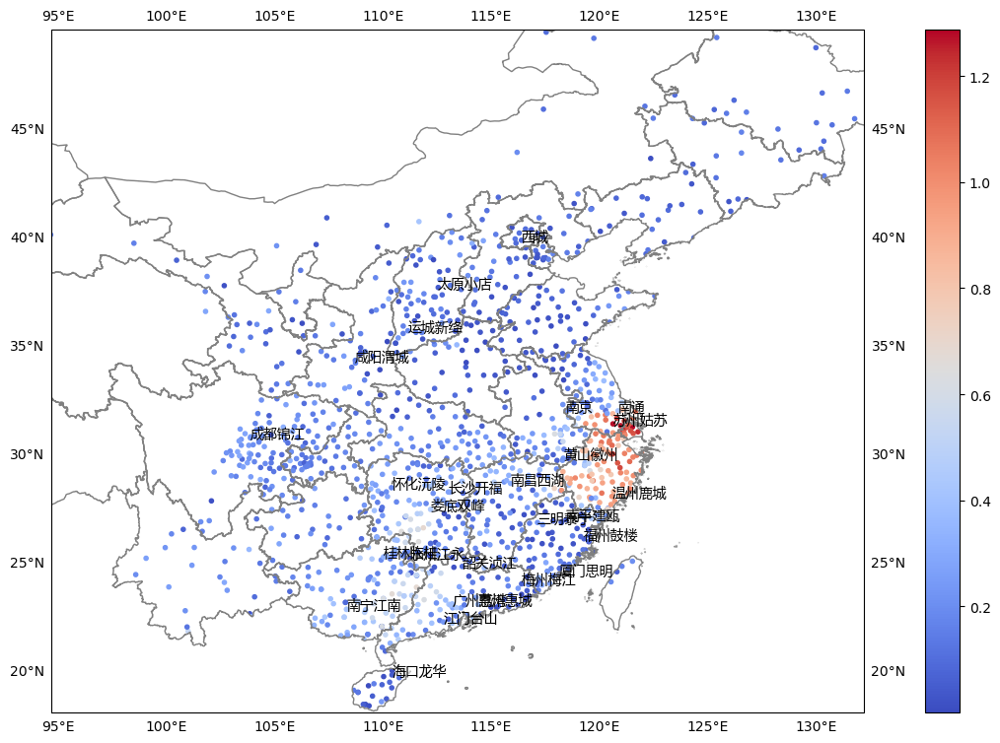

In [22]:
plt.figure(figsize=(16, 9))
ax, _, cs = sinetym.plot.geography.scatter(
    dialect['latitude'],
    dialect['longitude'],
    dialect['voiced2'],
    scale=3,
    clip=china,
    marker='.',
    cmap='coolwarm'
)
ax.add_geometries(province, ax.projection, edgecolor='gray', facecolor='none')

for _, r in dialect[dialect['representative']].iterrows():
    ax.annotate(r['spot'], xy=r[['longitude', 'latitude']], family='Microsoft Yahei')

gl = ax.gridlines(draw_labels=True)
gl.xlines = False
gl.ylines = False
plt.colorbar(cs)
plt.show()
plt.close()

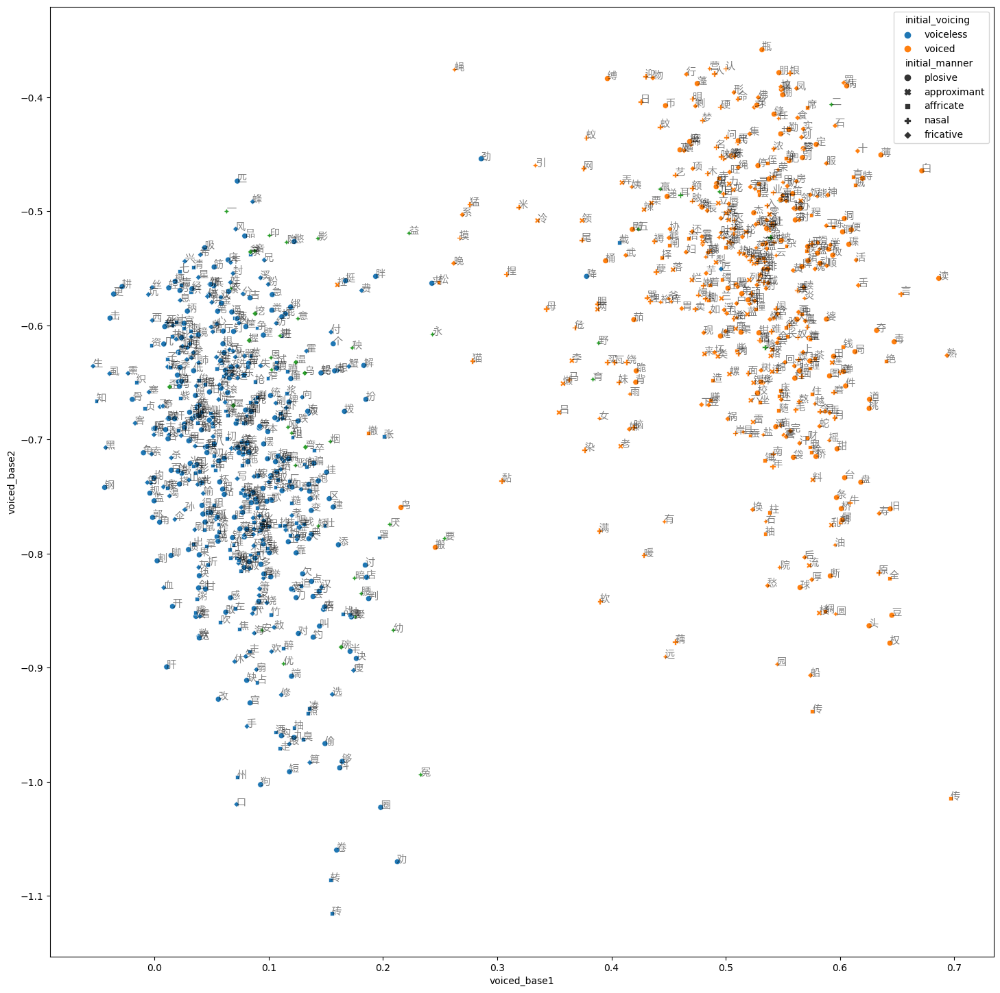

In [23]:
voiced_trans = get_transform(voiced_dialect_dir, weight, residual=True)
s, q = np.linalg.eig(voiced_trans @ voiced_trans.T)
char[['voiced_base1', 'voiced_base2']] = (char_emb @ np.take(q, np.argsort(s)[::-1][:2], axis=-1))

plt.figure(figsize=(32, 18))
ax = plt.axes(aspect='equal')

sns.scatterplot(char, x='voiced_base1', y='voiced_base2', hue='initial_voicing', style='initial_manner', palette='tab10', ax=ax)
for _, r in char[char['character'].notna()].iterrows():
    ax.annotate(r['character'], xy=r[['voiced_base1', 'voiced_base2']], alpha=0.5, family='Microsoft Yahei')

plt.show()
plt.close()

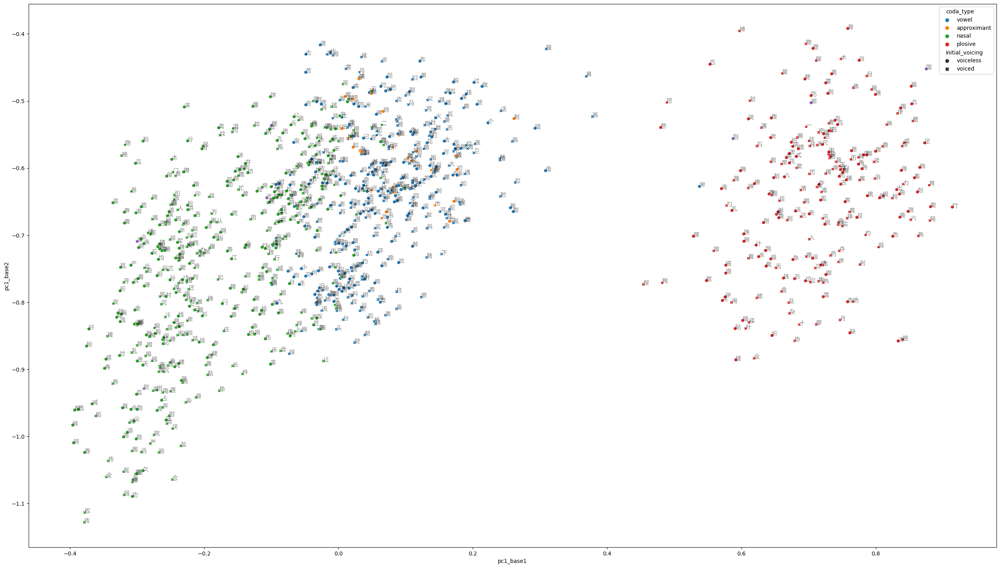

In [24]:
trans = get_transform(dialect_pca.components_[0], weight, residual=True)
s, q = np.linalg.eig(trans @ trans.T)
char[['pc1_base1', 'pc1_base2']] = (char_emb @ np.take(q, np.argsort(s)[::-1][:2], axis=-1))

plt.figure(figsize=(32, 18))
ax = plt.axes(aspect='equal')

sns.scatterplot(char, x='pc1_base1', y='pc1_base2', hue='coda_type', style='initial_voicing', palette='tab10', ax=ax)
for _, r in char[char['character'].notna()].iterrows():
    ax.annotate(r['character'], xy=r[['pc1_base1', 'pc1_base2']], alpha=0.5, family='Microsoft Yahei')

plt.show()
plt.close()

In [51]:
input_emb = get_emb(input_embs, data[input_columns])
output_emb = np.stack([get_emb((e,), data[[c]]) for e, c in zip(output_embs, output_columns)], axis=1)
trans = np.swapaxes(np.tensordot(np.linalg.pinv(input_emb), output_emb, (-1, 0)), 0, 1)

for i, t in enumerate(('initial', 'final', 'tone')):
    char[[f'trans1_{t}_pc1', f'trans1_{t}_pc2']] = globals()[f'{t}_pca'].transform(char_emb @ trans[i])

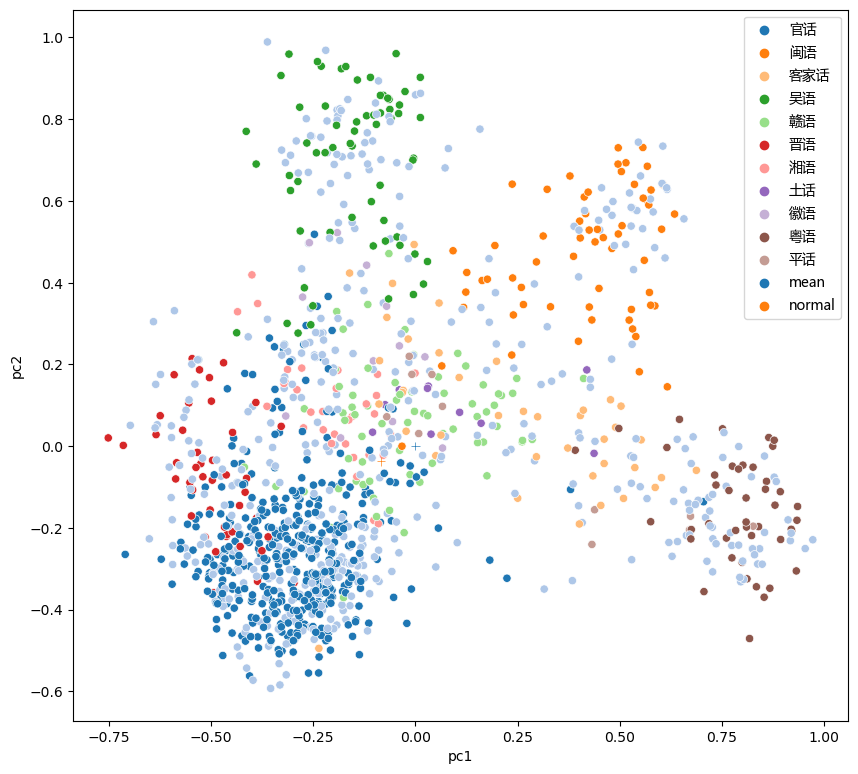

In [52]:
mean_dialect_emb = np.mean([np.mean(e, axis=0) for e in dialect_embs], axis=0)

xtx = input_emb.T @ input_emb
ata = np.tensordot(np.tensordot(weight, xtx, [1, 0]), weight, [[1, 2], [2, 1]])
xty = input_emb.T @ np.mean(output_emb, axis=1)
atb = np.tensordot(weight, xty, [[1, 2], [0, 1]])
normal_dialect_emb = np.tensordot(np.linalg.inv(ata), atb, [-1, 0])

pc = pd.DataFrame({'type': ['mean', 'normal']})
pc[[f'pc{i + 1}' for i in range(dialect_pca.n_components_)]] = dialect_pca.transform(np.stack([mean_dialect_emb, normal_dialect_emb]))

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')
sns.scatterplot(dialect, x='pc1', y='pc2', hue='group', palette='tab20', ax=ax)
sns.scatterplot(pc, x='pc1', y='pc2', hue='type', marker='+', ax=ax)
ax.legend(prop={'family': 'Microsoft Yahei'})
plt.show()
plt.close()

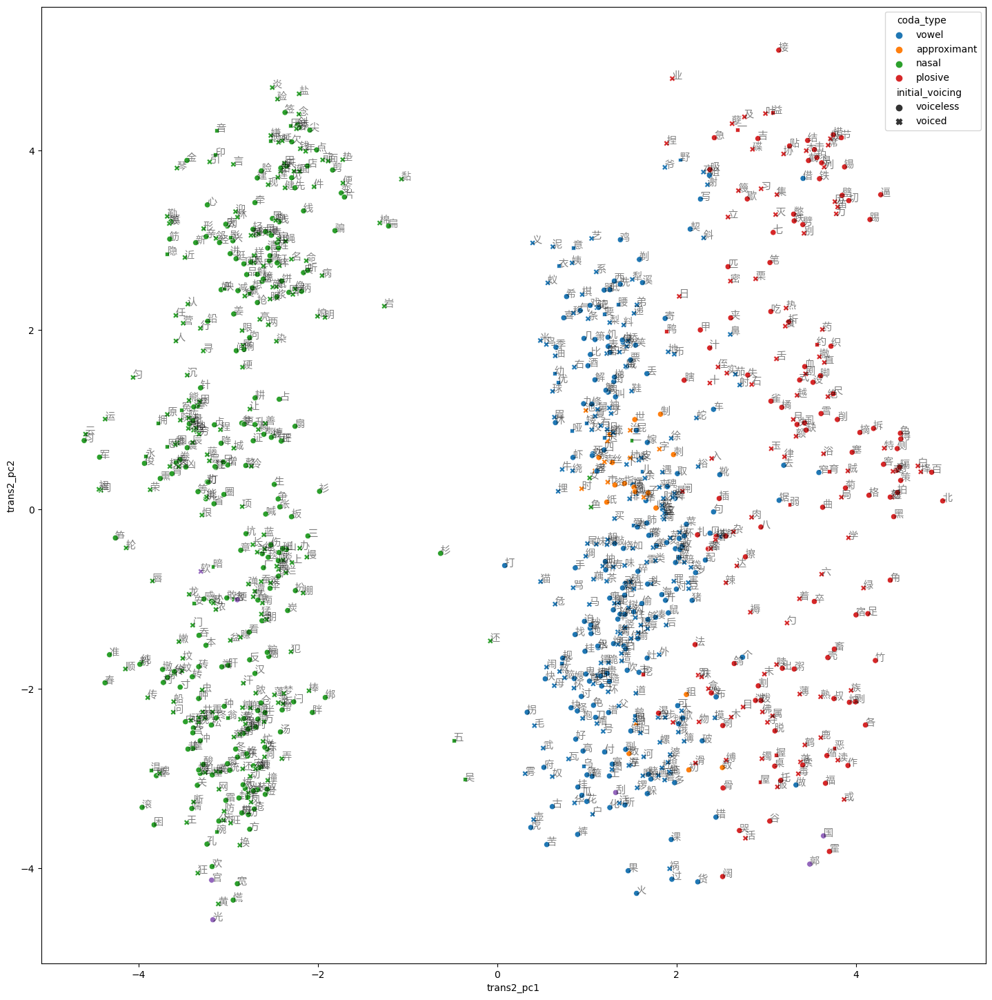

In [53]:
trans2_emb = char_emb @ get_transform(mean_dialect_emb, weight, residual=True)
char[['trans2_pc1', 'trans2_pc2']] = PCA(2).fit_transform(trans2_emb)

plt.figure(figsize=(32, 18))
ax = plt.axes(aspect='equal')

sns.scatterplot(char, x='trans2_pc1', y='trans2_pc2', hue='coda_type', style='initial_voicing', palette='tab10', ax=ax)
for _, r in char[char['character'].notna()].iterrows():
    ax.annotate(r['character'], xy=r[['trans2_pc1', 'trans2_pc2']], alpha=0.5, family='Microsoft Yahei')

plt.show()
plt.close()

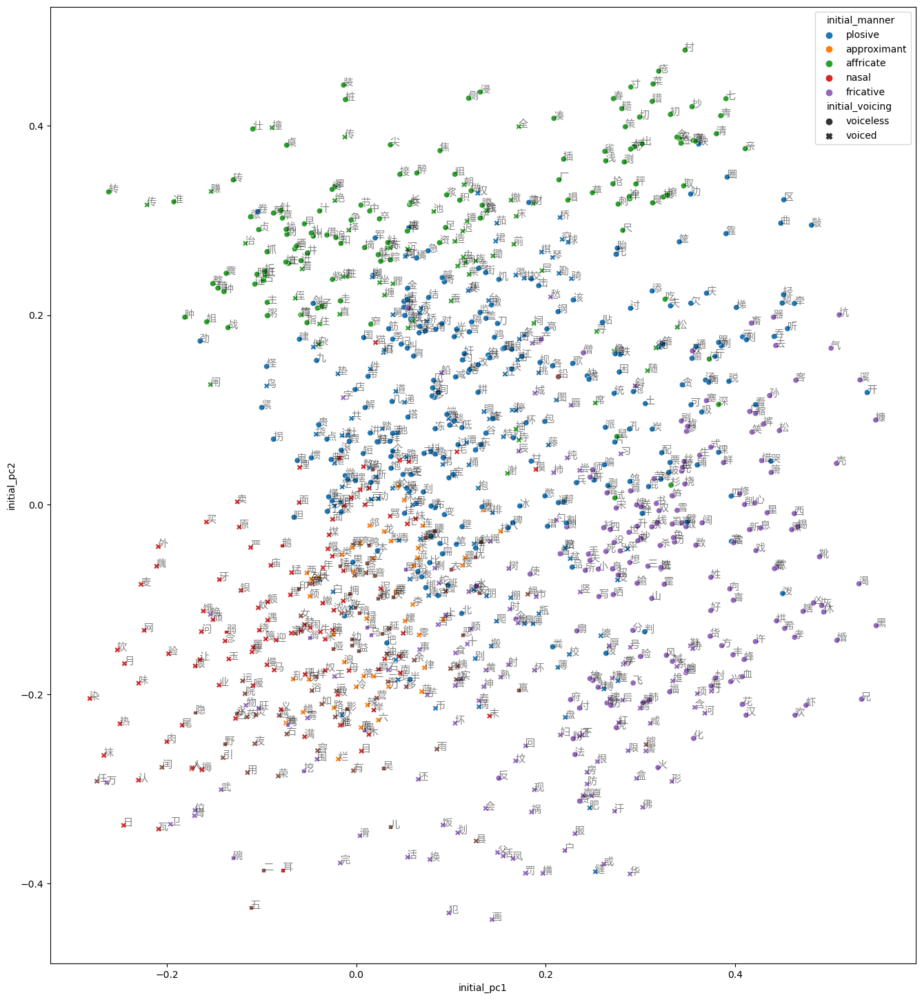

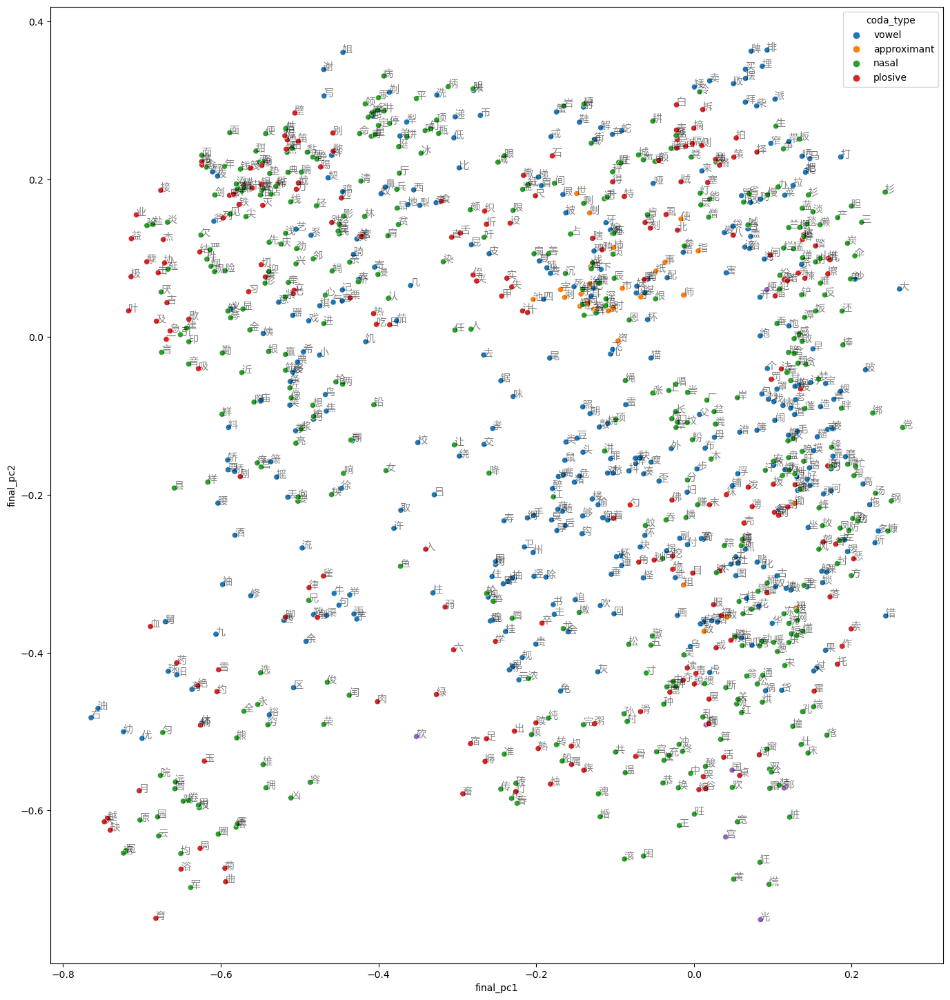

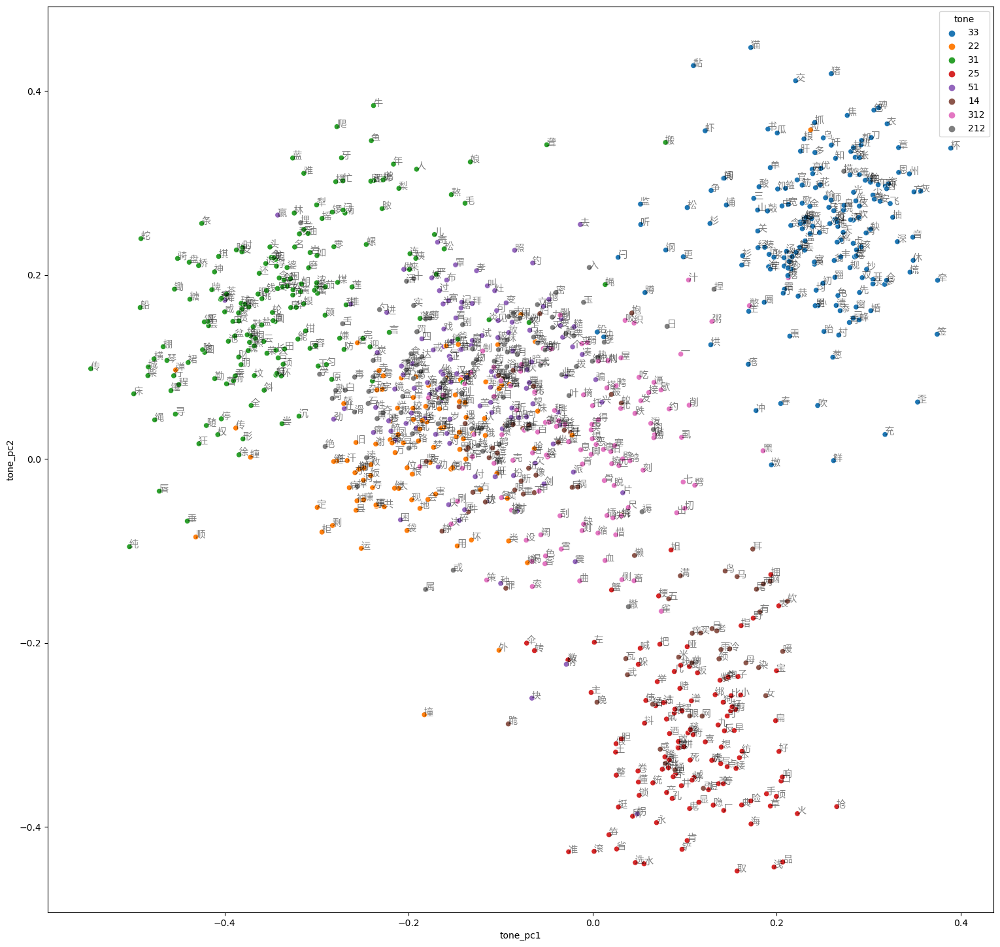

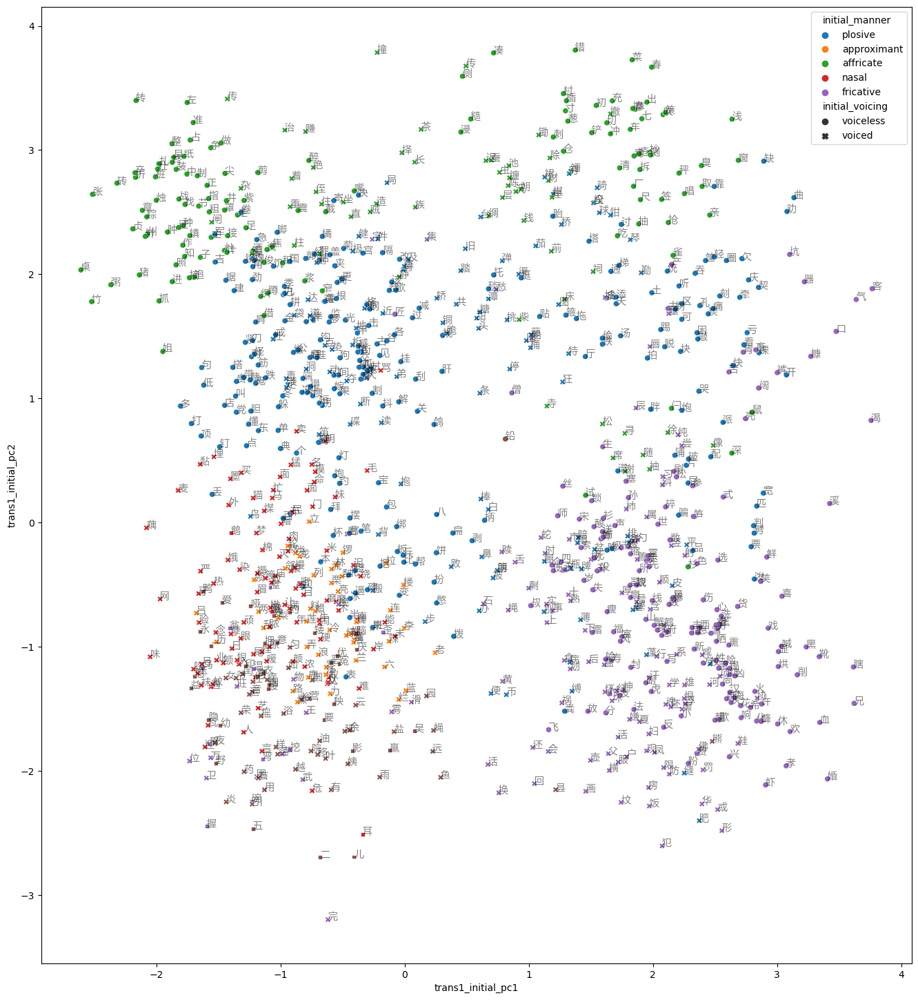

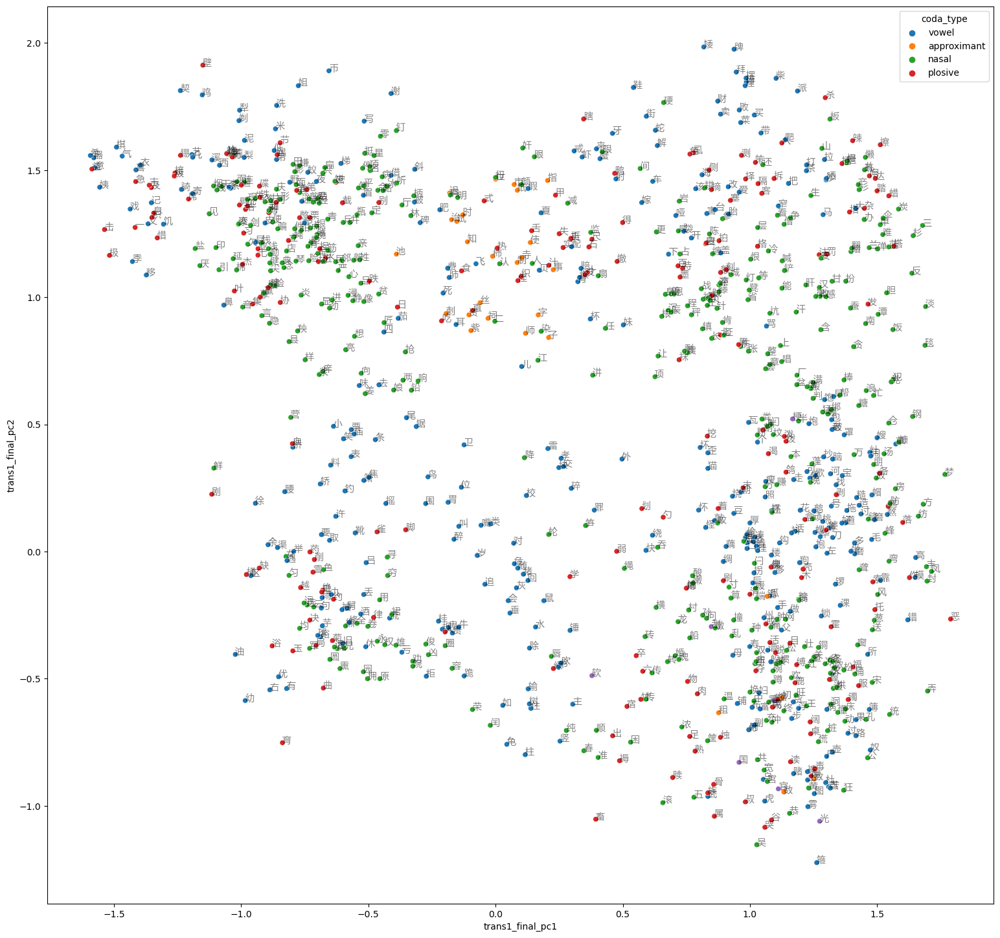

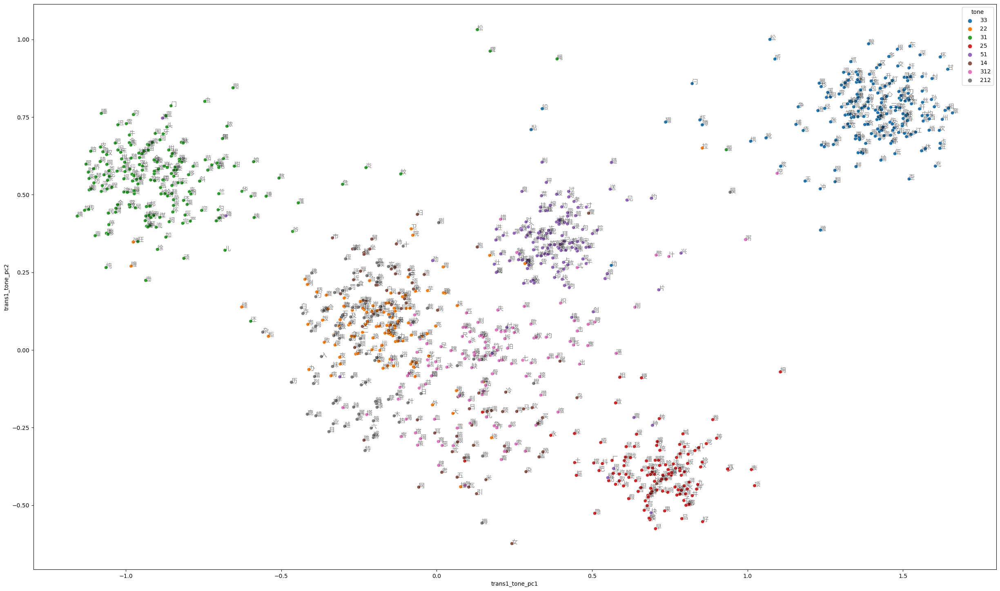

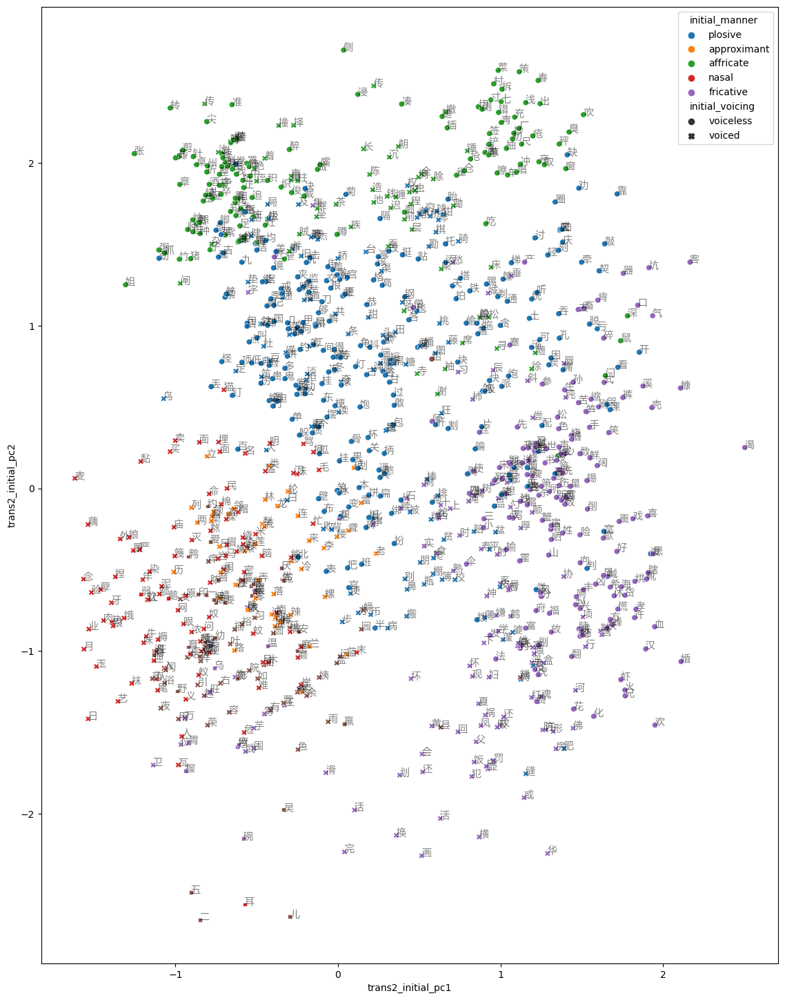

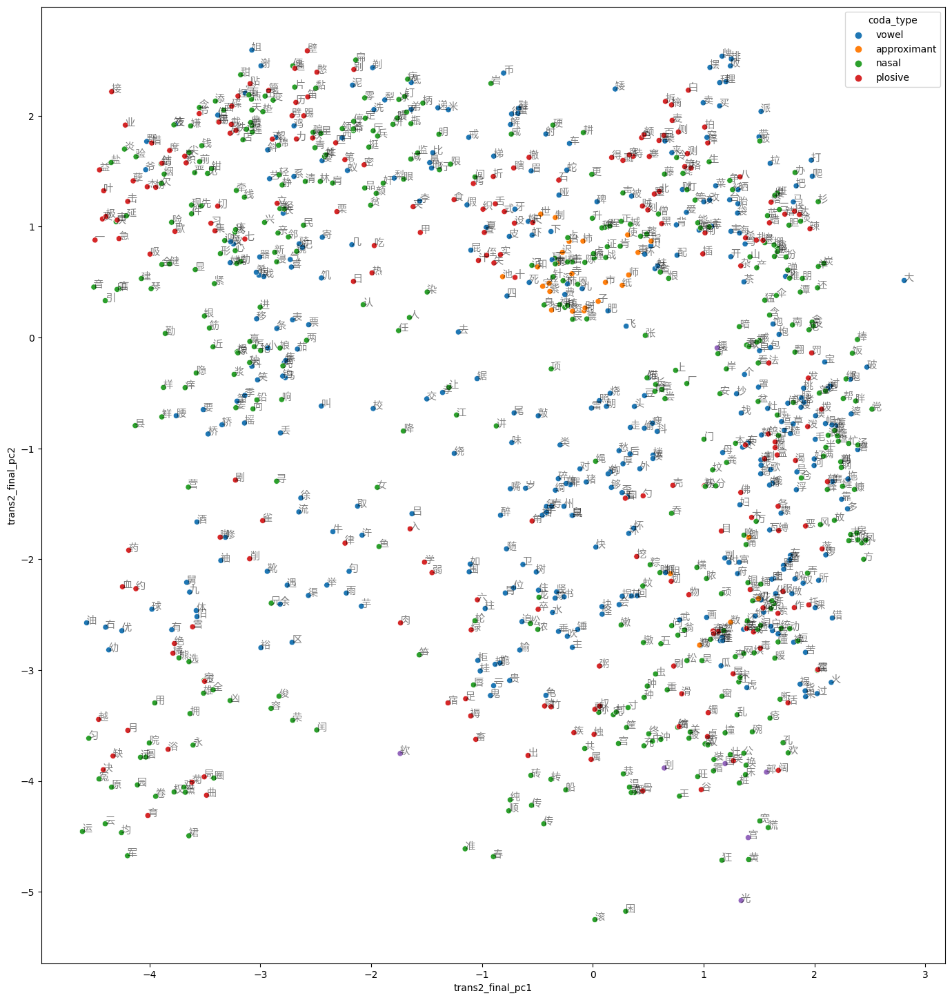

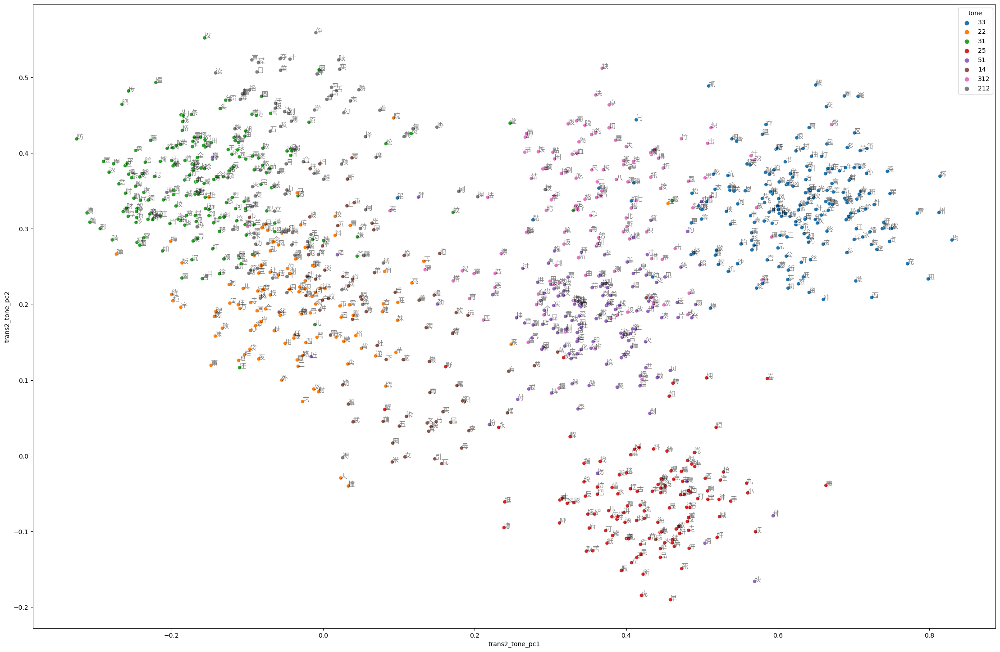

In [55]:
for t in ('initial', 'final', 'tone'):
    char[[f'{t}_pc1', f'{t}_pc2']] = globals()[f'{t}_pca'].transform(char_emb)
    char[[f'trans2_{t}_pc1', f'trans2_{t}_pc2']] = globals()[f'{t}_pca'].transform(trans2_emb)

for prefix in ('', 'trans1_', 'trans2_'):
    plt.figure(figsize=(32, 18))
    ax = plt.axes(aspect='equal')

    sns.scatterplot(
        char,
        x=f'{prefix}initial_pc1',
        y=f'{prefix}initial_pc2',
        hue='initial_manner',
        style='initial_voicing',
        palette='tab10',
        ax=ax
    )
    for _, r in char[char['character'].notna()].iterrows():
        ax.annotate(
            r['character'],
            xy=r[[f'{prefix}initial_pc1',
            f'{prefix}initial_pc2']],
            alpha=0.5,
            family='Microsoft Yahei'
        )

    plt.show()
    plt.close()

    plt.figure(figsize=(32, 18))
    ax = plt.axes(aspect='equal')

    sns.scatterplot(
        char,
        x=f'{prefix}final_pc1',
        y=f'{prefix}final_pc2',
        hue='coda_type',
        palette='tab10',
        ax=ax
    )
    for _, r in char[char['character'].notna()].iterrows():
        ax.annotate(
            r['character'],
            xy=r[[f'{prefix}final_pc1',
            f'{prefix}final_pc2']],
            alpha=0.5,
            family='Microsoft Yahei'
        )

    plt.show()
    plt.close()

    plt.figure(figsize=(32, 18))
    ax = plt.axes(aspect='equal')

    sns.scatterplot(
        char,
        x=f'{prefix}tone_pc1',
        y=f'{prefix}tone_pc2',
        hue='tone',
        palette='tab10',
        ax=ax
    )
    for _, r in char[char['character'].notna()].iterrows():
        ax.annotate(
            r['character'],
            xy=r[[f'{prefix}tone_pc1',
            f'{prefix}tone_pc2']],
            alpha=0.5,
            family='Microsoft Yahei'
        )

    plt.show()
    plt.close()

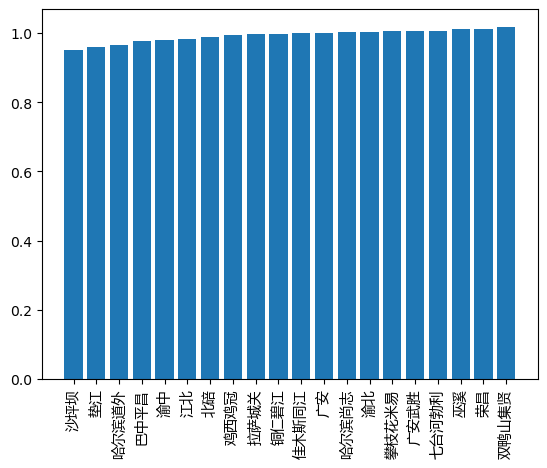

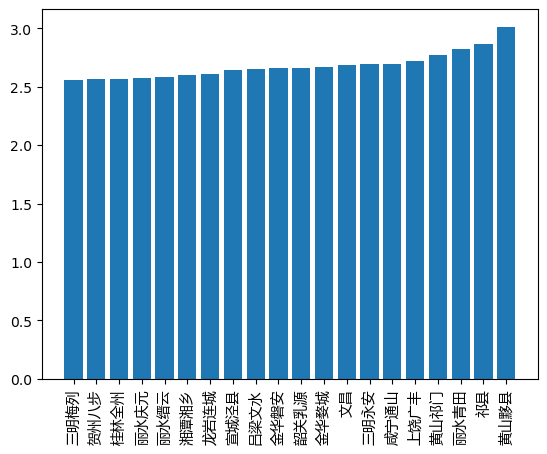

In [56]:
dialect['dist'] = np.linalg.norm(dialect_emb - mean_dialect_emb[None, :], axis=1)
dialect_sort = dialect.sort_values('dist')

plt.bar(dialect_sort[:20].index, dialect_sort[:20]['dist'], tick_label=dialect_sort[:20]['spot'])
plt.xticks(rotation='vertical', family='Microsoft Yahei')
plt.show()
plt.close()

plt.bar(dialect_sort[-20:].index, dialect_sort[-20:]['dist'], tick_label=dialect_sort[-20:]['spot'])
plt.xticks(rotation='vertical', family='Microsoft Yahei')
plt.show()
plt.close()

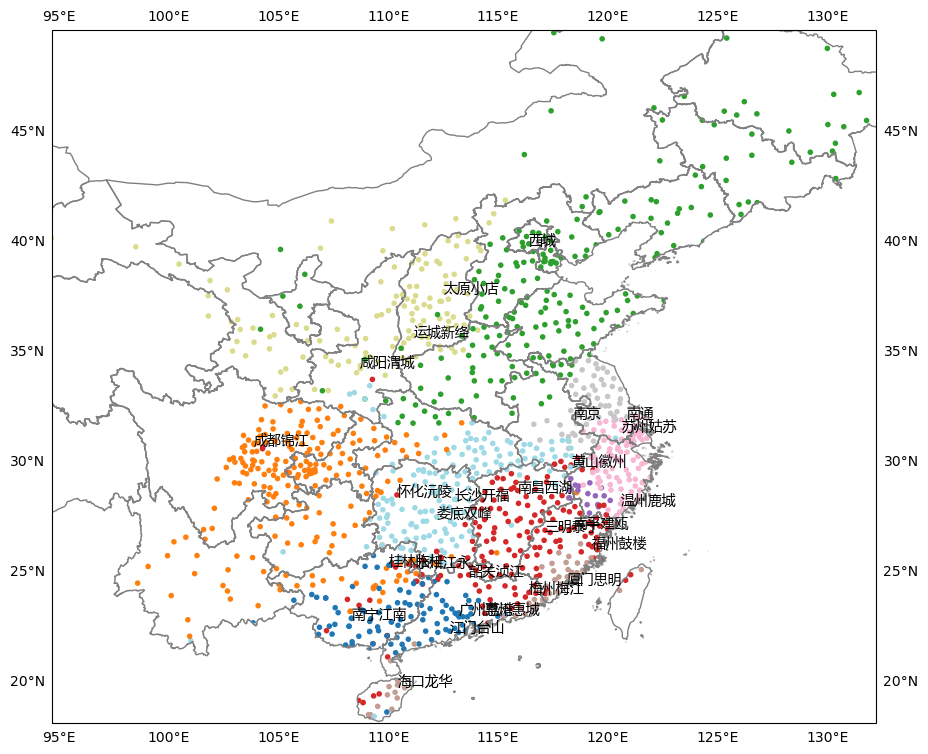

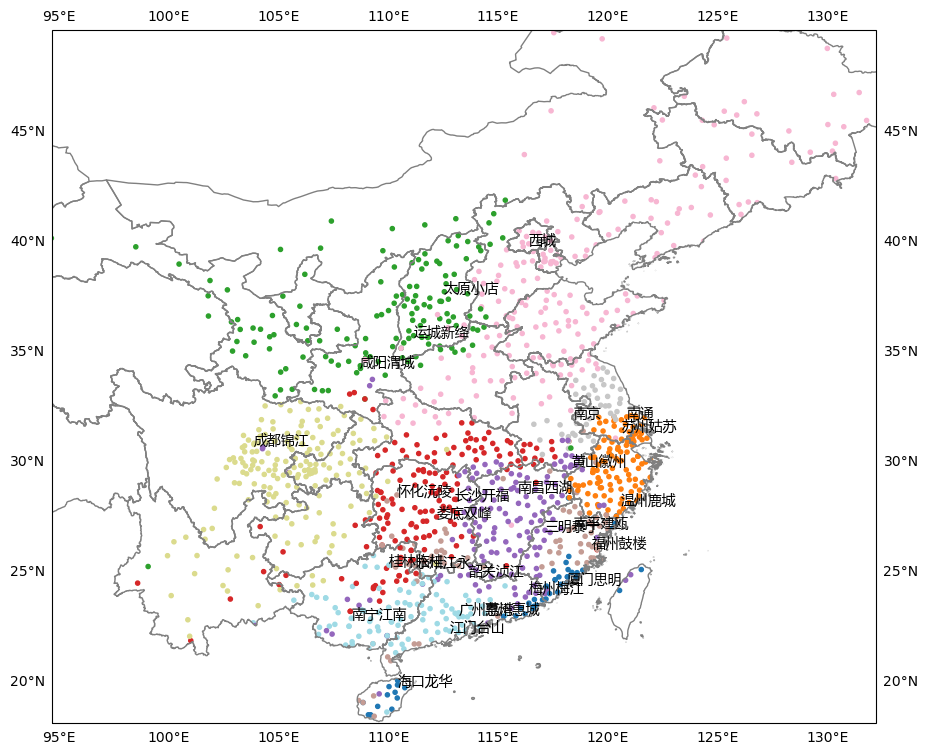

In [57]:
for cluster in (KMeans(10, n_init='auto'), AgglomerativeClustering(10)):
    labels = cluster.fit_predict(dialect_emb)

    plt.figure(figsize=(16, 9))
    ax, _, _ = sinetym.plot.geography.scatter(
        dialect['latitude'],
        dialect['longitude'],
        labels,
        scale=3,
        clip=china,
        marker='.',
        cmap='tab20'
    )
    ax.add_geometries(province, ax.projection, edgecolor='gray', facecolor='none')

    for _, r in dialect[dialect['representative']].iterrows():
        ax.annotate(r['spot'], xy=r[['longitude', 'latitude']], family='Microsoft Yahei')

    gl = ax.gridlines(draw_labels=True)
    gl.xlines = False
    gl.ylines = False
    plt.show()
    plt.close()

In [58]:
input_mean = np.mean(char_emb, axis=0)
s = char_emb - input_mean[None, :]
input_cov = s.T @ s / (s.shape[0] - 1)

trans = get_transform(get_emb(dialect_embs, dialect_sample[dialect_columns]), weight, residual=True)
wtw_eig_val, wtw_eig_vec = np.linalg.eig(trans @ np.swapaxes(trans, -1, -2))
trans2 = wtw_eig_vec * np.sqrt(np.maximum(wtw_eig_val, 0))[:, None, :] @ np.swapaxes(wtw_eig_vec, -1, -2)

d = trans2[:, None, ...] - trans2[None, :, ...]
a = np.swapaxes(d, -1, -2) @ d
a_eig_val, a_eig_vec = np.linalg.eig(a)
b = a_eig_vec * np.sqrt(np.maximum(a_eig_val, 0))[:, :, None, :]
cov = np.swapaxes(b, -1, -2) @ np.swapaxes(np.tensordot(b, input_cov, [2, 0]), -1, -2)
dist = np.sum(np.linalg.eigvals(cov), axis=-1) \
    + np.tensordot(np.tensordot(input_mean, a, [-1, 2]), input_mean, [-1, -1])

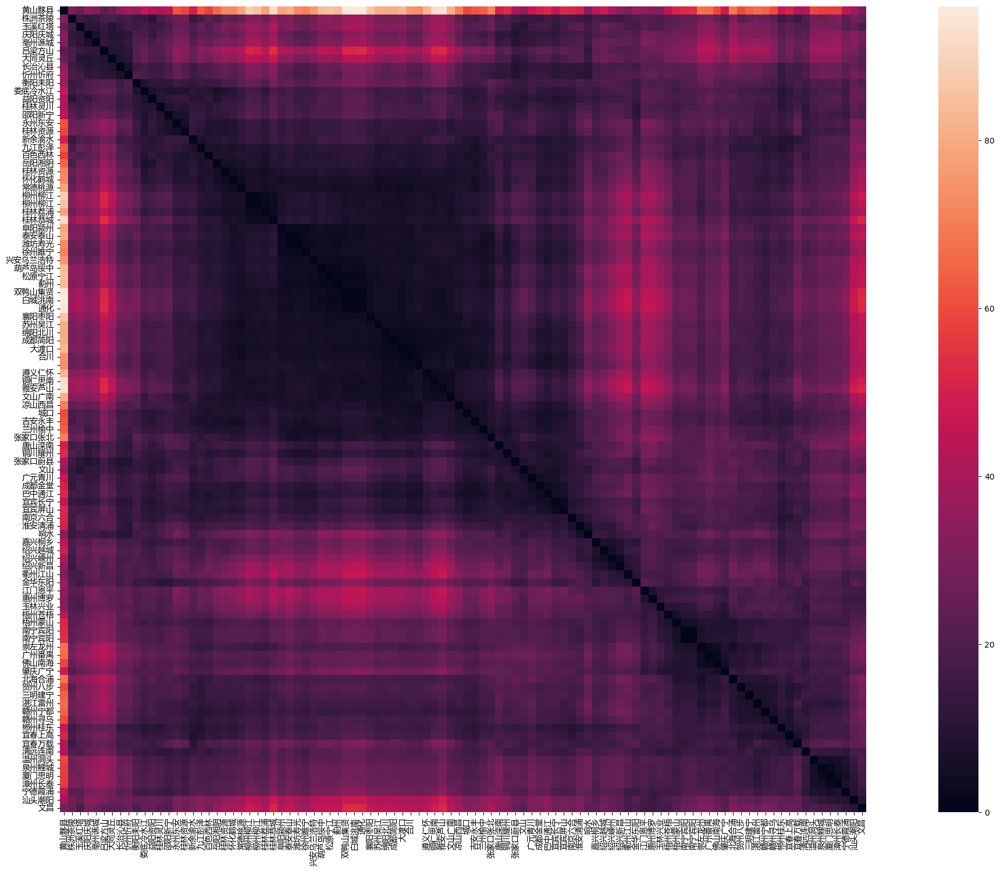

In [59]:
plt.figure(figsize=(32, 18))
plt.xticks(rotation='vertical', family='Microsoft Yahei')
plt.yticks(rotation='horizontal', family='Microsoft Yahei')
sinetym.plot.heatmap(dist, dialect_sample['spot'])
plt.show()
plt.close()

In [60]:
demb = np.repeat(get_emb(dialect_embs, [['Z26516mb01'], ['Z15233mb01'], ['Z10G71mb01']]), char_emb.shape[0], axis=0)
cemb = np.tile(char_emb, (3, 1))
oemb = transform(demb, cemb, weight, residual=True)
probs = scs.softmax(decode(oemb, output_embs, output_biases)[0][:, :-1], axis=-1)
probs = np.reshape(probs, (3, char_emb.shape[0], -1))

code = output_encoder.transform([['p', 'ə', '24'], ['pʰ', 'ak', '5']])
prob = np.empty((probs.shape[0], probs.shape[1]), dtype=probs.dtype)
prob[0] = probs[0][:, code[0, 0]]
prob[1] = probs[1][:, code[1, 0]]
prob[2] = prob[0] * prob[1]
prob = normalize((prob @ probs[2]), norm='l1')

prob = pd.DataFrame(prob.T, columns=['Changsha p', 'Meizhou pʰ', 'Changsha p, Meizhou pʰ'])
prob['Suzhou'] = initial.index

prob.sort_values('Changsha p, Meizhou pʰ', ascending=False)[:10].plot.bar('Suzhou')
plt.show()
plt.close()

AttributeError: 'list' object has no attribute 'shape'

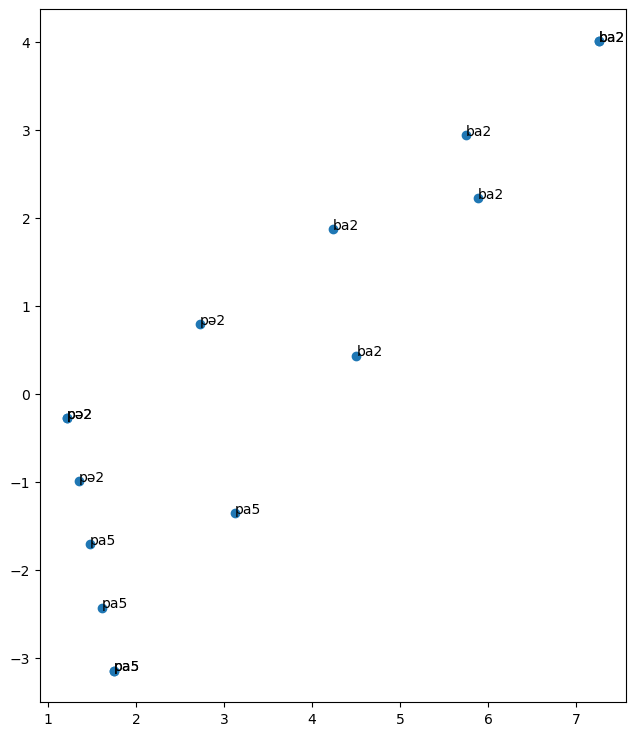

In [ ]:
demb = np.concatenate([
    np.linspace(did.loc['Z10G71mb01'], did.loc['Z26516mb01'], 5),
    np.linspace(did.loc['Z26516mb01'], did.loc['Z15233mb01'], 5),
    np.linspace(did.loc['Z15233mb01'], did.loc['Z10G71mb01'], 5)
], axis=0)
bai_output_emb = transform(demb, np.repeat(get_emb(input_embs, char.loc[['Z0843'], input_columns]), demb.shape[0], axis=0), weight, residual=True)
bai_outputs = get_output(output_embs, bai_output_emb, output_biases)
bai_output_pc = output_pca.transform(bai_output_emb)

plt.figure(figsize=(10, 10))
ax = plt.axes(aspect='equal')

ax.scatter(x=bai_output_pc[:, 0], y=bai_output_pc[:, 1])
for i in range(bai_outputs.shape[0]):
    ax.annotate(''.join(bai_outputs[i]), xy=bai_output_pc[i, :2])

plt.show()
plt.close()